# Machine Learning Assignment 2026

**Authors:** Kristina Fairushina, Luís Carlos Ferreira Freitas, Rui Pedro Seabra Carvalho Pinto Tabuaço



## Contribution note

This is a group submission.

- Kristina Fairushina — 40%
- Luís Carlos Ferreira Freitas — 20%
- Rui Pedro Seabra Carvalho Pinto Tabuaço — 40%


# **1. Produce the following artificial datasets in balanced (50/50) and unbalanced (90/10) class distributions.**

In this part of the assignment, we generated a diverse set of synthetic datasets to represent different types of classification problems. These include datasets such as:

*   Headlights
*   Shell

*  DD
*  XOR

*  Chess4
*   Roseta (with two and three concentric structures)

For most datasets, both balanced and imbalanced versions are created by controlling the class distribution through minority class proportion parameter. This allows the analysis of how classification methods behave not only under different geometric structures of the dataset but also in the presence of class imbalance.

Each dataset is designed to capture specific characteristics, such as linear separability, non-linear decision-boundaries, overlapping classes, or structured spatial patterns. This variety provides a comprehensive framework to evaluate and compare performance of different classifiers under diverse and controlled conditions

# **Environment setup**
Imports and global configuration for reproducibility and output formatting



In [ ]:
# =====================================================================
# Environment setup - ALL imports and global configuration for the
# WHOLE assignment (first leg AND second leg).
# Run this cell first; no later cell needs to re-import these.
# =====================================================================
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.lines import Line2D
from IPython.display import display

# --- scikit-learn: data, preprocessing, pipeline, validation ---
from sklearn.datasets import load_breast_cancer
from sklearn.base import clone
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold, learning_curve

# --- classifiers ---
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import (
    LinearDiscriminantAnalysis,
    QuadraticDiscriminantAnalysis,
)
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier

# --- metrics & visualisation helpers ---
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_score,
    recall_score, f1_score, roc_auc_score, roc_curve,
)
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.exceptions import ConvergenceWarning

# --- mlxtend: bias-variance decomposition + decision-region plots (2nd leg) ---
from mlxtend.evaluate import bias_variance_decomp
from mlxtend.plotting import plot_decision_regions

# --- global configuration (first leg) ---
RANDOM_STATE = 42
rng = np.random.default_rng(RANDOM_STATE)

plt.style.use("default")
np.set_printoptions(suppress=True, precision=3)
pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", 50)


In [ ]:
# Define the local plotting helper used inside Task 1.
def plot_dataset(X, y, ax, title):
    cmap = colors.ListedColormap(['royalblue', 'darkorange'])
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap, s=18, alpha=0.75, edgecolor='none')
    ax.set_title(title)
    ax.set_xlabel('x1')
    ax.set_ylabel('x2')
    ax.grid(alpha=0.2)

## **Headlights**
 2 gaussian blobs same covariance with some overlap, 1 class each.

In [ ]:
def make_headlights_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)
    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1
    shared_covariance = np.array([[1.2, 0.0], [0.0, 1.2]])
    class_0 = rng.multivariate_normal(mean=[0.0, 0.0], cov=shared_covariance, size=n_class_0)
    class_1 = rng.multivariate_normal(mean=[2.5, 0.0], cov=shared_covariance, size=n_class_1)
    X = np.vstack([class_0, class_1])
    y = np.array([0] * n_class_0 + [1] * n_class_1)
    return X, y

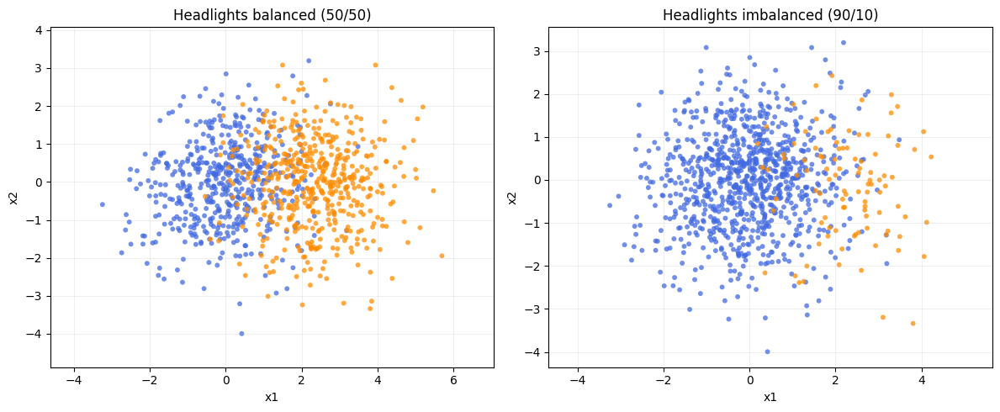

In [ ]:
X_headlights_bal, y_headlights_bal = make_headlights_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_headlights_imb, y_headlights_imb = make_headlights_dataset(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_headlights_bal, y_headlights_bal, axes[0], 'Headlights balanced (50/50)')
plot_dataset(X_headlights_imb, y_headlights_imb, axes[1], 'Headlights imbalanced (90/10)')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()

# **Shell**
 1 circular gaussian blob (class A) and one somewhat rectangular thin strip of points with the width of the blob (class B) slightly overlapping the edge of the blob. Balanced classes.`

In [ ]:
def make_shell_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)
    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1
    class_0 = rng.normal(loc=0.0, scale=0.4, size=(n_class_0, 2))
    strip_y = rng.uniform(low=-1.25, high=-0.75, size=n_class_1)
    strip_x = rng.uniform(low=-1, high=1, size=n_class_1)
    class_1 = np.column_stack([strip_x, strip_y])
    X = np.vstack([class_0, class_1])
    y = np.hstack([np.zeros(n_class_0, dtype=int), np.ones(n_class_1, dtype=int)])
    return X, y







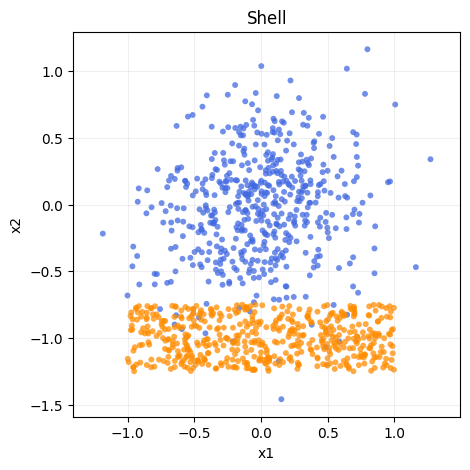

In [ ]:

X_shell, y_shell = make_shell_dataset(total_samples=1000, minority_share=0.5, random_state = RANDOM_STATE)
fig, axes = plt.subplots(1, figsize=(5, 5), squeeze = False)
plot_dataset(X_shell, y_shell, axes[0,0], 'Shell')
axes[0 , 0].axis('equal')
plt.show()

# **DD**
 1 half circular blob, D shaped (class A) and another similar one to the right almost touching but with almost no or minimal overlaping (class B)

In [ ]:


def make_d_shape_class(n_samples, center_x, side, radius, random_state=42):
    rng = np.random.default_rng(random_state)

    radii = radius * np.sqrt(rng.uniform(0, 1, n_samples))

    if side == "right":
        angles = rng.uniform(-np.pi / 2, np.pi / 2, n_samples)
    elif side == "left":
        angles = rng.uniform(np.pi / 2, 3 * np.pi / 2, n_samples)
    else:
        raise ValueError("side must be 'right' or 'left'")

    x = center_x + radii * np.cos(angles)
    y = radii * np.sin(angles)

    return np.column_stack([x, y])



def make_dd_dataset(total_samples=1000, minority_share=0.5, random_state=42):
    rng = np.random.default_rng(random_state)

    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1

    # Class 0 (D on the left)
    class_0 = make_d_shape_class(
        n_class_0,
        center_x=-1.10,
        side="right",
        radius=1.0,
        random_state=random_state
    )

    # Class 1 (inverted D on the right)
    class_1 = make_d_shape_class(
        n_class_1,
        center_x=1.10,
        side="left",
        radius=1.0,
        random_state=random_state + 1
    )

    # Combine
    X = np.vstack([class_0, class_1])
    y = np.hstack([
        np.zeros(n_class_0, dtype=int),
        np.ones(n_class_1, dtype=int)
    ])

    # Shuffle
    indices = rng.permutation(len(y))
    return X[indices], y[indices]


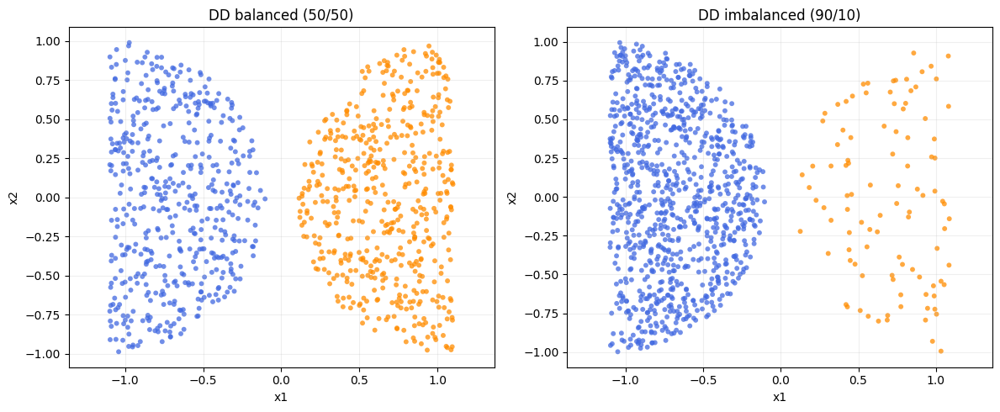

In [ ]:
X_dd_bal, y_dd_bal = make_dd_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_dd_imb, y_dd_imb = make_dd_dataset(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_dd_bal, y_dd_bal, axes[0], 'DD balanced (50/50)')
plot_dataset(X_dd_imb, y_dd_imb, axes[1], 'DD imbalanced (90/10)')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()


# **XOR**
 Four alternating squares: a 2 by 2 chess board alternating classes A and B

In [ ]:

def generate_square_points(n_points, x_range, y_range, rng):
    x_values = rng.uniform(x_range[0], x_range[1], n_points)
    y_values = rng.uniform(y_range[0], y_range[1], n_points)
    return np.column_stack([x_values, y_values])


def make_xor_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)
    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1



    n0_q1 = n_class_0 // 2
    n0_q2 = n_class_0 - n0_q1
    n1_q1 = n_class_1 // 2
    n1_q2 = n_class_1 - n1_q1

    class_0_a = generate_square_points(n0_q1, (-2.0, 0.0), (0.0, 2.0), rng)
    class_0_b = generate_square_points(n0_q2, (0.0, 2.0), (-2.0, 0.0), rng)
    class_1_a = generate_square_points(n1_q1, (0.0, 2.0), (0.0, 2.0), rng)
    class_1_b = generate_square_points(n1_q2, (-2.0, 0.0), (-2.0, 0.0), rng)

    X = np.vstack([class_0_a, class_0_b, class_1_a, class_1_b])
    y = np.array([0] * n_class_0 + [1] * n_class_1)

    return X, y

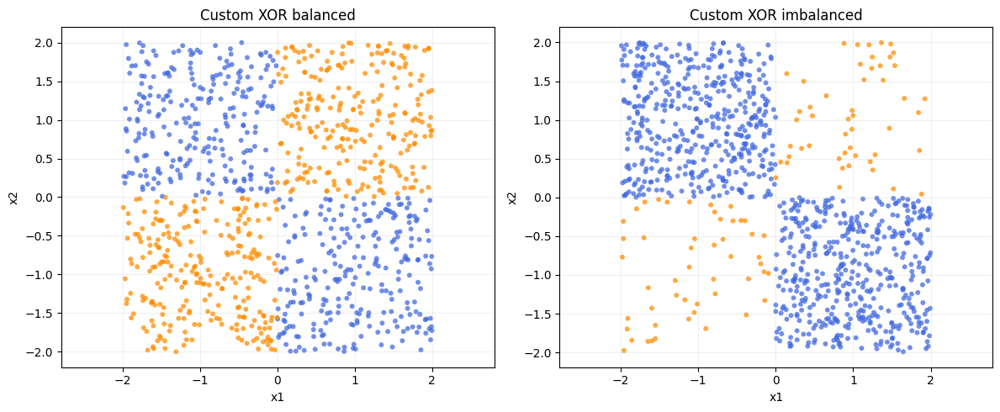

In [ ]:
X_xor_bal, y_xor_bal = make_xor_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_xor_imb, y_xor_imb = make_xor_dataset(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_xor_bal, y_xor_bal, axes[0], 'Custom XOR balanced')
plot_dataset(X_xor_imb, y_xor_imb, axes[1], 'Custom XOR imbalanced')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()

# **Chess4**
Creates a 4x4 checkerboard pattern, where adjacent squares belong to opposite classes


In [ ]:
def generate_chess4(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    """Chess4 (4x4 grid). minority_share=0.5 balanced, 0.9 unbalanced."""
    rng = np.random.default_rng(random_state)
    X = rng.uniform(0, 4, (total_samples * 2, 2))
    grid_coords = np.floor(X).astype(int)
    y_raw = (grid_coords[:, 0] + grid_coords[:, 1]) % 2
    X_a_raw = X[y_raw == 0]
    X_b_raw = X[y_raw == 1]
    n_a = int(total_samples * minority_share)
    n_b = total_samples - n_a
    idx_a = rng.choice(len(X_a_raw), n_a, replace=False)
    idx_b = rng.choice(len(X_b_raw), n_b, replace=False)
    X_final = np.vstack([X_a_raw[idx_a], X_b_raw[idx_b]])
    y_final = np.hstack([np.zeros(n_a), np.ones(n_b)])
    X_final += rng.normal(0, 0.1, X_final.shape)
    return X_final, y_final

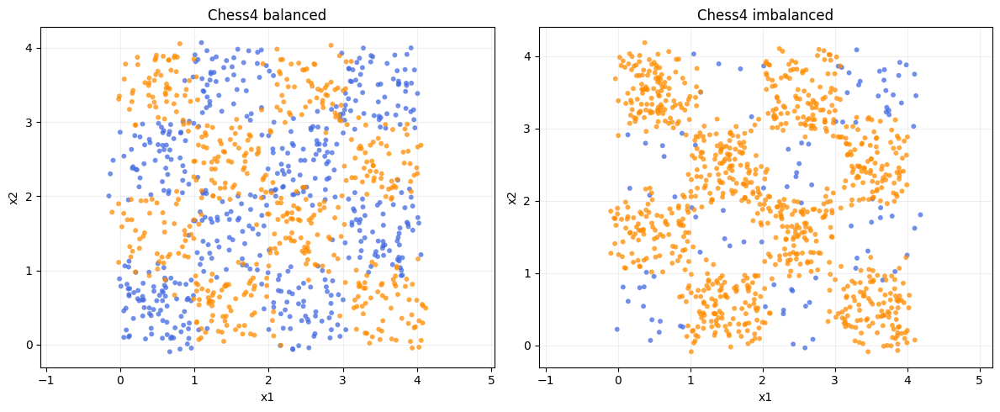

In [ ]:
X_chess_bal, y_chess_bal = generate_chess4(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_chess_imb, y_chess_imb = generate_chess4(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_chess_bal, y_chess_bal, axes[0], 'Chess4 balanced')
plot_dataset(X_chess_imb, y_chess_imb, axes[1], 'Chess4 imbalanced')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()

# **Roseta2**
1 round central blob (class A), 1 ring around the central blob, like a blob without the central part, where class A is (class B)

In [ ]:
def make_concentric_circles_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)
    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1
    angles_0 = rng.uniform(0.0, 2.0 * np.pi, size=n_class_0)
    angles_1 = rng.uniform(0.0, 2.0 * np.pi, size=n_class_1)
    radius_0 = rng.normal(loc=2.0, scale=0.08, size=n_class_0)
    radius_1 = rng.normal(loc=0.9, scale=0.08, size=n_class_1)
    class_0 = np.column_stack([radius_0 * np.cos(angles_0), radius_0 * np.sin(angles_0)])
    class_1 = np.column_stack([radius_1 * np.cos(angles_1), radius_1 * np.sin(angles_1)])
    X = np.vstack([class_0, class_1])
    y = np.array([0] * n_class_0 + [1] * n_class_1)
    return X, y

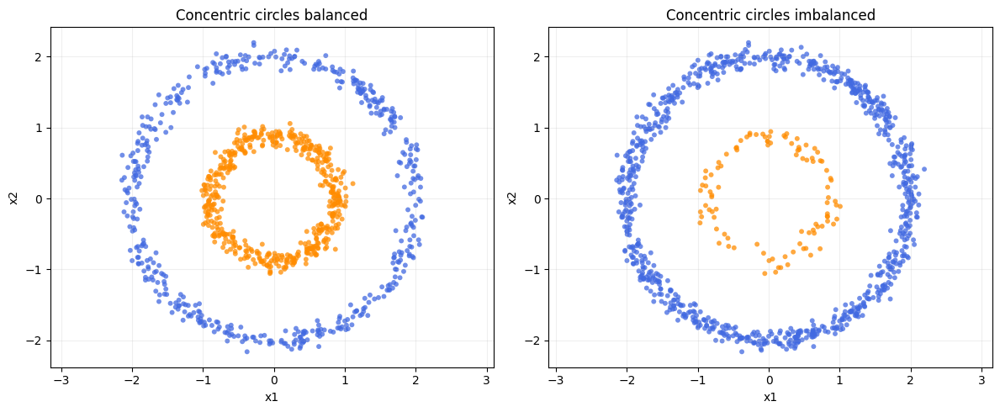

In [ ]:
X_circ_bal, y_circ_bal = make_concentric_circles_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_circ_imb, y_circ_imb = make_concentric_circles_dataset(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_circ_bal, y_circ_bal, axes[0], 'Concentric circles balanced')
plot_dataset(X_circ_imb, y_circ_imb, axes[1], 'Concentric circles imbalanced')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()

# **Roseta3**
Same as above, but 3 concentric rings with 2 alternating classes

In [ ]:
def make_roseta3_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)

    n_class_1 = int(total_samples * minority_share)
    n_class_0 = total_samples - n_class_1

    n_class_0_inner = n_class_0 // 2
    n_class_0_outer = n_class_0 - n_class_0_inner

    class_0_inner = rng.normal(loc=0.0, scale=0.4, size=(n_class_0_inner, 2))


    r1 = rng.normal(loc=2.5, scale=0.2, size=n_class_1)
    theta1 = rng.uniform(0, 2 * np.pi, size=n_class_1)
    class_1 = np.column_stack([r1 * np.cos(theta1), r1 * np.sin(theta1)])


    r0_out = rng.normal(loc=5.0, scale=0.2, size=n_class_0_outer)
    theta0_out = rng.uniform(0, 2 * np.pi, size=n_class_0_outer)
    class_0_outer = np.column_stack([r0_out * np.cos(theta0_out), r0_out * np.sin(theta0_out)])


    X = np.vstack([class_0_inner, class_0_outer, class_1])
    y = np.array([0] * n_class_0 + [1] * n_class_1)

    return X, y

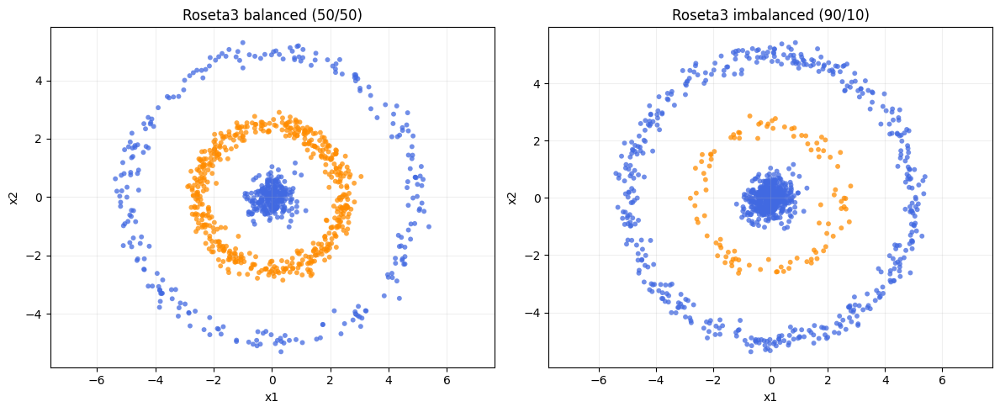

In [ ]:
X_rose3_bal, y_rose3_bal = make_roseta3_dataset(total_samples=1000, minority_share=0.5, random_state=RANDOM_STATE)
X_rose3_imb, y_rose3_imb = make_roseta3_dataset(total_samples=1000, minority_share=0.1, random_state=RANDOM_STATE)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
plot_dataset(X_rose3_bal, y_rose3_bal, axes[0], 'Roseta3 balanced (50/50)')
plot_dataset(X_rose3_imb, y_rose3_imb, axes[1], 'Roseta3 imbalanced (90/10)')
axes[0].axis('equal')
axes[1].axis('equal')
plt.tight_layout()
plt.show()

# **2. Consider the methods: 1NN, 5NN, 10NN, logistic regression, LDA and QDA.**

In this part of the assignment, several classification methods are evaluated using multiple performance metrics across a set of synthetic datasets with different geometric structures and class distributions.

The goal of this part is to understand how different classifiers behave under varying levels of data complexity, including linear separability, non-linear patterns and class imbalance

For each dataset, a training set and an independent test set are generated from the same underlying distribution. Each classifier is trained on the training data and then evaluated on the corresponding test set.

The performance of each model is assessed using the following metrics:

*   Accuracy - Proportion of correct predictions overall
*   Balanced Accuracy - Average accuracy per class (useful for imbalanced data)

*   Precision - Proportion of the predicted positives instances that are correctly identified

*   Recall - Proportion of actual positive instances that are correctly identified

*  F1-score - Harmonic mean of precision and recall

*   ROC curve - graph showing model performance across all thresholds (TPR vs FPR)

Finally, for each dataset, the classifiers are ranked according to their performance, allowing a direct comparison of which methods are most suitable for each type data distribution

In [ ]:
datasets = {"Headlights_Bal": make_headlights_dataset(total_samples=1000, minority_share=0.5),
               "Headlights_Imb": make_headlights_dataset(total_samples=1000, minority_share=0.1),
               "Shell": make_shell_dataset(total_samples=1000),
               "DD_Bal": make_dd_dataset(total_samples=1000, minority_share=0.5),
               "DD_Imb": make_dd_dataset(total_samples=1000, minority_share=0.1),
               "XOR_Bal": make_xor_dataset(total_samples=1000, minority_share=0.5),
               "XOR_Imb": make_xor_dataset(total_samples=1000, minority_share=0.1),
               "Chess4_Bal": generate_chess4(total_samples=1000, minority_share=0.5),
               "Chess4_Imb": generate_chess4(total_samples=1000, minority_share=0.1),
               "Roseta2_Bal": make_concentric_circles_dataset(total_samples=1000, minority_share=0.5),
               "Roseta2_Imb": make_concentric_circles_dataset(total_samples=1000, minority_share=0.1),
               "Roseta3_Bal": make_roseta3_dataset(total_samples=1000, minority_share=0.5),
               "Roseta3_Imb": make_roseta3_dataset(total_samples=1000, minority_share=0.1)
               }

models = {
        '1NN': KNeighborsClassifier(n_neighbors=1),
        '5NN': KNeighborsClassifier(n_neighbors=5),
        '10NN': KNeighborsClassifier(n_neighbors=10),
        'Logistic Regression': LogisticRegression(),
        'LDA': LinearDiscriminantAnalysis(),
        'QDA': QuadraticDiscriminantAnalysis()
           }



   # Evaluation
    # Train and Test — 70/30
results = {}
rows = []

for dataset_name, (X, y) in datasets.items():
      X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.3, random_state=RANDOM_STATE)



      scaler = StandardScaler()
      X_train = scaler.fit_transform(X_train)
      X_test = scaler.transform(X_test)

      results[dataset_name] = {}
      for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        metrics = {
          "accuracy": accuracy_score(y_test, y_pred),
          "balanced_acc": balanced_accuracy_score(y_test, y_pred),
          "f1": f1_score(y_test, y_pred, zero_division=0),
          "precision": precision_score(y_test, y_pred, zero_division=0),
          "recall": recall_score(y_test, y_pred, zero_division=0)}

        rows.append({
        "dataset": dataset_name,
        "model": model_name,
        **metrics})

df = pd.DataFrame(rows)


print("\n=== Rankings per dataset (by ACCURACY — as required by Task 2.a) ===\n")
for dataset in df['dataset'].unique():
    subset = df[df['dataset'] == dataset]
    ranking = subset.sort_values(by="accuracy", ascending=False)
    print(f"\n{dataset}")
    print(ranking[["model", "accuracy", "f1", "balanced_acc", "precision", "recall"]].round(3).to_string(index=False, col_space=12))

print("\n\n=== Secondary view: rankings by F1 (more robust to the 90/10 accuracy paradox; see note below) ===\n")
for dataset in df['dataset'].unique():
    subset = df[df['dataset'] == dataset]
    ranking = subset.sort_values(by="f1", ascending=False)
    print(f"\n{dataset}")
    print(ranking[["model", "f1", "accuracy", "balanced_acc", "precision", "recall"]].round(3).to_string(index=False, col_space=12))



=== Rankings per dataset (by ACCURACY — as required by Task 2.a) ===


Headlights_Bal
              model     accuracy           f1  balanced_acc    precision       recall
Logistic Regression        0.877        0.874         0.877        0.895        0.853
                LDA        0.877        0.874         0.877        0.895        0.853
                QDA        0.877        0.875         0.877        0.890        0.860
                5NN        0.867        0.868         0.867        0.857        0.880
               10NN        0.867        0.866         0.867        0.872        0.860
                1NN        0.787        0.784         0.787        0.795        0.773

Headlights_Imb
              model     accuracy           f1  balanced_acc    precision       recall
Logistic Regression        0.927        0.593         0.723        0.842        0.457
                LDA        0.923        0.582         0.721        0.800        0.457
                QDA        0.923     

# **Analysis of Model Rankings Across Datasets**

**General Overview**

The results show that the performance of classification methods strongly depends on the structure of the dataset. There is no absolute best model - instead, each method performs better under specific conditions such as linear separability, non-linearity, or class imbalance.

**1. Linear Models (Logistic Regression and LDA)**

Logistic Regression and LDA assume that the decision boundary between classes is linear, and in the case of LDA, that each class follows a Gaussian distribution with equal covariance matrices.

In datasets where these assumptions are approximately satisfied, these models achieve strong and consistent performance across all metrics. For example, in the  **Headlights_Bal**, both Logistic Regression and LDA achieve:

*   F1 = 0.874
*   Accuracy = 0.877

*   Balanced Accuracy = 0.877
*   Precision = 0.895

*   Recall = 0.853

This suggests that the models are not only accurate but also maintain a good balance between precision and recall

Similarly, in **Shell**, performance remains very strong:

*  F1 between 0.943 and 0.965
*  Balanced Accuracy between 0.94-0.96

*  Precision and Recall both close to 0.9-1.0

This indicates both classes are well captured and the decision boundary aligns well with data structure.

However, in non-linear datasets, performance degrades significantly across all metrics. This is especially evident in:

*   **XOR_Bal:** F1 = 0.500, Accuracy = 0.500, Balanced Accuracy = 0.500
* **XOR_Imb**: F1 = 0.0, Balanced Accuracy = 0.5, Recall = 0.0

*   **Chess4_Bal**: F1 = 0.468, Balanced Accuracy ≈ 0.45
*   **Roseta2_Imb**: F1 = 0.0, Precision = 0.0, Recall = 0.0
*   **Roseta3_Imb**: F1 = 0.0, Precision = 0.0, Recall = 0.0

Here the combination of:

*   low recall (failure to detect positive class)
*   low precision (poor class discrimination)

*   and balanced accuracy near 0.5

These values confirm that the models are effectively performing random and degenerate classification due to violation of the linearity assumption.

**2. K-Nearest Neighbors (kNN)**

The kNN classifiers (1NN, 5NN and 10NN) rely on local neighborhood structure instead of global assumptions, making them highly flexible in non-linear problems.

This is reflected across multiple metrics. In **XOR_Bal**, kNN achieves:

*   F1 between 0.973 and 0.980
*   Balanced Accuracy ≈ 0.97-0.98

*  Precision and Recall both high

This indicates that both classes are being correctly identified, with minimal trade-off between precision and recall.

Similarly, in **Roseta2_Bal** and **Roseta3_Bal**, kNN achieves perfect results:

* F1 = 1.0
* Accuracy = 1.0
* Balanced Accuracy = 1.0
* Precision = 1.0
* Recall = 1.0

These results show that the local structure fully separates the classes.

However, in imbalanced datasets such as **Headlights_Imb** and **Chess4_Imb**, kNN shows a different behaviour:

* Precision tends to remain high
* Recall decreases significantly
* Balanced Accuracy is lower than Accuracy

This indicates that kNN becomes biased towards the majority class in local neighborhoods, missing minority samples, which reduces recall and balanced performance.

Additionally, the choice of *k* is a bias–variance control. **1NN** has the lowest bias but the highest variance: it fits every single point, so it is sensitive to noise and unstable (only 0.787 accuracy on Headlights_Bal, where the classes overlap). **5NN/10NN** average over a neighbourhood, giving smoother boundaries — slightly higher bias but lower variance and more stable precision/recall (0.867 on the same set). This is the same bias–variance trade-off we study quantitatively in the second leg.

**3. Quadratic Discriminant Analysis (QDA)**

QDA allows each class to have its own covariance matrix, producing quadratic decision boundaries and increasing model flexibility.

These values show a well-balanced classifier, similar to linear models, but slightly more expressive.

In **XOR_Bal**, QDA performs exceptionally well:

* F1 = 0.987
* Balanced Accuracy = 0.987
* Precision = 0.980
* Recall = 0.993

The high recall and precision indicate that QDA correctly models the non-linear structure with very low classification error.

**Why QDA can do this — and where it fails.** QDA's only structural assumption is a *single quadratic* decision boundary (a conic: a line-pair, ellipse, circle or hyperbola). That is exactly enough for some non-linear shapes and useless for others, which explains its split results across the datasets:

* **XOR (2×2)** — one class lies in the two diagonal quadrants where $x_1 x_2 > 0$ and the other where $x_1 x_2 < 0$, so the single quadric $x_1 x_2 = 0$ separates them almost perfectly (QDA ranks **first**, accuracy 0.987).
* **Roseta2** — a central blob inside one ring is separated by a single circle, again one conic, so QDA reaches **1.000**.
* **Chess4 (4×4)** — the boundary must change sign many times along each axis, which a single conic cannot do, so QDA collapses to ≈ chance (accuracy 0.503).
* **Roseta3** — three alternating rings need at least two concentric circles; one conic is not enough, so QDA drops to 0.747.

So QDA wins precisely when one quadratic curve suffices and fails when the class boundary needs several — a direct consequence of its assumptions.

QDA also has a cost: it estimates a **full covariance matrix per class**, many more parameters than LDA (which shares one). On the imbalanced sets (e.g. **Headlights_Imb**) the ≈10% minority class gives a noisy covariance estimate, so QDA's boundary has higher variance — recall and balanced accuracy drop even though precision stays high. More data per class would stabilise it.

**4. Overall Interpretation**

Overall, the combination of all metrics provides a much richer understanding of model behaviour than accuracy alone.

* Accuracy can be misleading in imbalanced datasets (example: high accuracy but poor recall)
* Balanced accuracy correctly highlights performance degradation in minority classes.
* Precision and recall reveal the trade-off between false positives and false negatives

* **Ranking is by accuracy on the independent test set, as required by Task 2.a** (the per-dataset tables above are sorted by accuracy). F1-score and balanced accuracy are reported alongside as complementary metrics, because on the 90/10 sets accuracy alone is misleading: a classifier that predicts only the majority class still scores ≈ 0.88–0.90 accuracy while completely missing the minority class (recall = 0).

The results show that:

* Linear models fail when linearity assumptions are violated

* kNN performs well in non-linear spaces but struggles with imbalance

* QDA provides a strong balance between flexibility and structure

In [ ]:
# ---------------------------------------------------------------
# Aggregate model ranking across datasets (mean rank, 1 = best).
# Reuses the metrics already in `df` (no model is retrained). Within
# each dataset every model is ranked 1..6 by the chosen metric (ties
# share the average rank); we then average those ranks across the
# datasets in each group. Lower mean rank = better overall.
# ---------------------------------------------------------------
MODEL_ORDER = ["1NN", "5NN", "10NN", "Logistic Regression", "LDA", "QDA"]

all_datasets = list(df["dataset"].unique())
balanced_datasets = [d for d in all_datasets if d.endswith("_Bal") or d == "Shell"]
imbalanced_datasets = [d for d in all_datasets if d.endswith("_Imb")]

def mean_rank_table(datasets, metric):
    per_ds = [
        df[df["dataset"] == d].set_index("model")[metric]
          .rank(ascending=False, method="average")
        for d in datasets
    ]
    ranks = pd.concat(per_ds, axis=1)
    table = (ranks.mean(axis=1)
                  .reindex(MODEL_ORDER)
                  .sort_values()
                  .round(2)
                  .rename("mean_rank")
                  .to_frame())
    table.index.name = "model"
    return table

print(f"1) Average rank across all {len(all_datasets)} datasets - by ACCURACY (1 = best)")
display(mean_rank_table(all_datasets, "accuracy"))

print(f"\n2) Average rank across all {len(all_datasets)} datasets - by F1 (1 = best)")
display(mean_rank_table(all_datasets, "f1"))

print(f"\n3) Average rank on the {len(balanced_datasets)} BALANCED datasets - by ACCURACY (1 = best)")
display(mean_rank_table(balanced_datasets, "accuracy"))

print(f"\n4) Average rank on the {len(imbalanced_datasets)} IMBALANCED datasets - by ACCURACY (1 = best)")
display(mean_rank_table(imbalanced_datasets, "accuracy"))


1) Average rank across all 13 datasets - by ACCURACY (1 = best)


,mean_rank
model,
5NN,2.85
10NN,2.88
1NN,3.15
QDA,3.31
Logistic Regression,4.19
LDA,4.62



2) Average rank across all 13 datasets - by F1 (1 = best)


,mean_rank
model,
5NN,2.77
10NN,2.85
QDA,3.12
1NN,3.27
Logistic Regression,4.31
LDA,4.69



3) Average rank on the 7 BALANCED datasets - by ACCURACY (1 = best)


,mean_rank
model,
QDA,2.57
10NN,2.79
5NN,3.21
1NN,3.43
Logistic Regression,4.21
LDA,4.79



4) Average rank on the 6 IMBALANCED datasets - by ACCURACY (1 = best)


,mean_rank
model,
5NN,2.42
1NN,2.83
10NN,3.00
Logistic Regression,4.17
QDA,4.17
LDA,4.42


# **Aggregate ranking — which method wins across datasets?**

The per-dataset tables answer Task 2.a for each dataset individually. To see the **overall** picture we average each method's rank across datasets — a standard way to compare methods (lower mean rank = better; cf. Demšar, 2006). Rank 1 = best on a dataset.

**1. By accuracy, all 13 datasets.** The kNN family leads (5NN 2.85, 10NN 2.88, 1NN 3.15), then QDA (3.31), with the linear models last (Logistic Regression 4.19, LDA 4.62). Averaged over many geometries the **local** methods win: they make no global assumption about the shape of the boundary, so they adapt to XOR, the concentric rings and the blobs alike. The linear models sit last because half of the datasets (XOR, Chess4, Roseta) are not linearly separable.

**2. By F1, all 13 (robustness check).** Almost the same order (5NN 2.77, 10NN 2.85, QDA 3.12, 1NN 3.27, Logistic Regression 4.31, LDA 4.69) — only QDA and 1NN swap. Since F1 punishes "predict the majority only" (which inflates accuracy on the 90/10 sets), this confirms the kNN dominance is **not** an artifact of the metric.

**3. By accuracy, balanced sets only (7).** Here **QDA jumps to first (2.57)**, ahead of 10NN (2.79) and 5NN (3.21). When both classes are well represented, QDA's per-class covariance is estimated reliably, so its single quadratic (conic) boundary wins on XOR / Roseta2 / Shell. With enough data, a parametric model whose shape matches the data can beat the local methods.

**4. By accuracy, imbalanced sets only (6).** **QDA collapses from 1st (2.57) to 5th (4.17)**, while 5NN (2.42), 1NN (2.83) and 10NN (3.00) stay on top. With only ~10% of the minority class, QDA's per-class covariance estimate becomes noisy and its boundary unstable — exactly the weakness flagged in the analysis above. kNN's local rule is far more robust to imbalance.
> *Caveat:* on the imbalanced sets accuracy partly flatters the linear models (the accuracy paradox — they reach ≈ 0.88 just by predicting the majority); under F1 / balanced accuracy they fall further.

**Takeaway.** There is no single winner: **kNN is the most robust on average**, **QDA is best when classes are balanced and its quadratic shape fits the data**, and the **linear models only excel when the boundary is genuinely linear** (Headlights, Shell). The sharpest signal is QDA's swing from best (balanced) to near-worst (imbalanced), which shows how strongly QDA depends on a clean per-class covariance estimate.


# **ROC Curve Visualization**
The ROC curve is graphical tool used to evaluate the performance of classification models. Instead of relying on a single threshold (as in accuracy or F1-score), the ROC curve considers all possible thresholds, providing  a more comprehensive evaluation of model behaviour.

The curve is constructed by plotting True Positive Rate (TPR) against False Positive Rate (FPR). A model with good discriminative ability will produce a curve that approaches the top-left corner of the plot, indicating high true positive rates and low false positive rates. In contrast, a model with no predictive power will produce a curve close to the diagonal line, corresponding to random guessing.

To summarize the performance in a single value, the Area Under the Curve (AUC) is commonly used. Higher AUC values indicate better overall performance, with a value of 1 representing a perfect classifier and 0.5 corresponding to random performance.

In this work, ROC curves are used to compare the different classifiers across all datasets, allowing a clear visual assessment of how well each model separates the classes under varying data distributions.

ROC curves provide a more complete view of model discrimination ability compared to threshold-dependent metric, as they capture performance across the full range of decision thresholds.


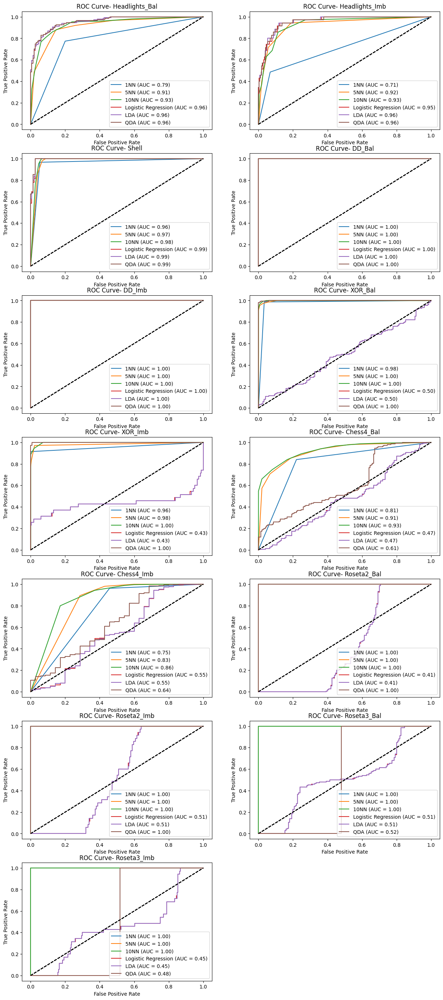

In [ ]:
n_datasets = len(datasets)
n_cols = 2
n_rows = (n_datasets + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for dataset_name, (X, y) in datasets.items():
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_STATE)
  ax = axes[list(datasets.keys()).index(dataset_name)]

  for name, clf in models.items():
    model = make_pipeline(StandardScaler(), clf)
    model.fit(X_train, y_train)

    if hasattr(model, "predict_proba"):
      y_score = model.predict_proba(X_test)[:, 1]
    else:
      y_score = model.decision_function(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_score)
    auc = roc_auc_score(y_test, y_score)
    ax.plot(fpr, tpr, label=f"{name} (AUC = {auc:.2f})")

    ax.plot([0, 1], [0, 1], 'k--')
    ax.set_title(f"ROC Curve- {dataset_name}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right")

for i in range(n_datasets, n_rows * n_cols):
  axes[i].axis('off')
plt.show()

# **ROC Curve Analysis Across Datasets**

**1. Linear Models (Logistic Regression and LDA)**

Logistic Regression and LDA assume linear decision boundaries, and LDA further assumes Gaussian distributions with equal covariance.

In **Headlights_Bal**, these models perform very well, with ROC curves close to the top-left corner and AUC = 0.96, indicating excellent class separability for both LDA and Logistic Regression models.

Similarly, in **Shell**, performance remains very strong, with AUC=0.99.

However, in non-linear datasets, performance drops drastically. For example:
* **XOR_Bal**: AUC = 0.50, where the model behaves like random guessing
* **XOR_Imb / Roseta3 / Chess4**: AUC = 0.43-0.55 (all near the 0.5 chance line)

Despite sometimes high accuracy ( like in **XOR_Imb** where accuracy=0.883) both recall and precision are 0, meaning that the model predicts only the majority class.

This shows that the accuracy alone is misleading in imbalanced datasets, while ROC and AUC reveal poor discrimination.

 **2. QDA (Quadratic Discriminant Analysis)**

**QDA** allows non-linear decision boundaries by relaxing the equal covariance assumption and estimating class-specific covariance matrices.

In simpler datasets:


*   **Headlights_Bal**: F1 = 0.875, AUC = 0.96
*   **Shell**: F1= 0.968, AUC = 0.99

In **XOR_bal**, it performs extremely well:
* F1 = 0.987
* AUC = 1.00

This shows its ability to capture non-linear structures.

However, in more complex or imbalanced datasets:
* **XOR_Imb**: F1 = 0.627, AUC = 1.00 but lower recall (0.457)
* **Chess4_Bal**: F1 = 0.511, AUC = 0.61

This indicates instability when assumptions (Gaussian distributions) are violated or when data is highly structured.

**3. k-Nearest Neighbors (1NN, 5NN, 10NN)**
KNN methods are non-parametric and adapt well to complex structures. Across most datasets, they consistently achieve strong performance:

* **XOR_Bal**: F1 = 0.97-0.98, AUC = 0.98-1.00
* **Chess4_Bal**: F1 = 0.82-0.84, AUC = 0.81-0.93
* **Roseta datasets**: F1 = 1.00, AUC = 1.00

These results show near-perfect classification, with ROC curves tightly hugging to the top left corner, reflecting a great class separability.

**Effect of k**
* **1NN**: Very high recall  (recall = 0.99 in imbalanced cases). Can overfit and be sensitive to noise

**5NN/10NN**: More stable. Better balance between precision and recall. Smoother ROC curves

**Imbalanced datasets**

KNN handles imbalance better than linear models due to its local decision rule. For
 example, in **XOR_Imb**:
 * 1NN: Accuracy = 0.990 F1 = 0.955, Recall = 0.914
 * Logistic Regression: Accuracy= 0.883, F1 = 0.0, Recall = 0.0
This shows that even when the accuracy may appear reasonable in some cases, like in linear models, ROC curves reveals poor discrimination (the AUC for Logistic Regression in **XOR_Imb** dataset is equal to 0.43), while KNN maintains a high AUC (0.96).

**4. Perfect Separation Cases (DD only)**
Only on **DD_Bal** and **DD_Imb** do all six models achieve:
* F1 = 1.0
* Accuracy = 1.0
* AUC = 1.0

It is possible to verify that the ROC curves collapse to the top-left corner, indicating perfect discrimination between classes. This suggests that:

* The problem is trivially separable
* the model choice is irrelevant for this type of dataset.

**The ring datasets are not like this.** On **Roseta2 / Roseta3** only the local methods (kNN) reach AUC = 1.0 — plus QDA on Roseta2, where a single circle suffices — while the linear models stay near chance (Logistic Regression / LDA on Roseta2_Bal: F1 ≈ 0.43, AUC ≈ 0.41). So 'all methods perfect' holds for DD only, not for the concentric-ring data.

**Key Insights from ROC Curves**
* AUC close to 1.0 shows an excellent separability (KNN, QDA in non-linear data)

* AUC close to 0.5 shows random behaviour (Logistic Regression, LDA in XOR/Roseta)

 ROC curves confirm that:
* High accuracy does not mean good performance
* In some cases, models completely ignore the minority class, resulting in a recall of 0, which indicates that all minority instances are misclassified. ( **XOR_Imb dataset with LDA model**)
* AUC captures performance across all thresholds, being more reliable


Combining all the metrics and ROC analysis:
* **kNN methods** are more robust across all datasets
* **QDA** performs well in moderately complex non-linear problems
* **Logistic Regression and LDA** only work well for linearly separable data

**Accuracy paradox (90/10 sets).** On the unbalanced Roseta2, Roseta3 and XOR sets, the top-accuracy model often predicts only the majority class (recall = 0, F1 = 0) while still scoring accuracy ≈ 0.90. Balanced accuracy and F1 are the honest metrics here.

# **Visualization of Classifier Decision Boundaries and Performance**

In this section, the behaviour of each classification method is visualized across all previously generated synthetic datasets.

To better understand how each model separates the classes, decision boundaries are plotted alongside the training and test points. This allows a direct visual comparison between the learned decision regions and the underlying structure of each dataset.

The combination of quantitative metrics and visual inspection provides a comprehensive view of model behaviour, highlight strengths and weaknesses under different noise levels and class distributions.

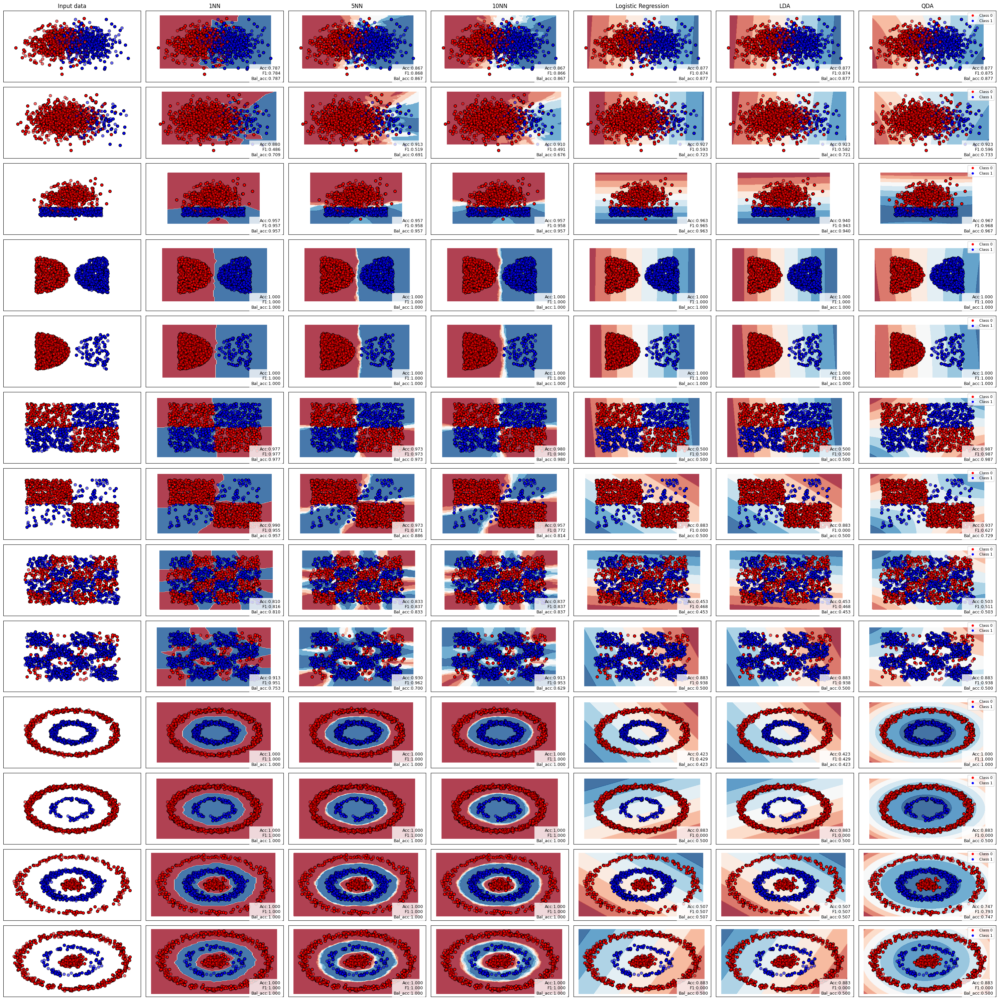

In [ ]:
from sklearn.base import clone
figure = plt.figure(figsize=(30,30))
i = 1
# Iterate over the datasets
for row_idx,(dataset_name,(X, y)) in enumerate(datasets.items()):
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_STATE)
  x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
  y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
#Plot the dataset first
  cm = plt.cm.RdBu
  cm_bright = colors.ListedColormap(['#FF0000', '#0000FF'])
  ax = plt.subplot(len(datasets), len(models) + 1, i)
  if row_idx == 0:
    ax.set_title("Input data")

  # Plot the training points
  ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors='k')
  # Plot the testing points
  ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6, edgecolors='k')

  ax.set_xlim(x_min, x_max)
  ax.set_ylim(y_min, y_max)
  ax.set_xticks(())
  ax.set_yticks(())
  i += 1

# Iterate over the classifiers
  for col_idx, (name, clf) in enumerate(models.items()):
    ax = plt.subplot(len(datasets), len(models) + 1, i)
    model = make_pipeline(StandardScaler(), clone(clf))
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    bal_acc = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, zero_division=0)
    prec = precision_score(y_test, y_pred, zero_division=0)
    rec = recall_score(y_test, y_pred, zero_division=0)

    DecisionBoundaryDisplay.from_estimator(model, X_test, cmap=cm, alpha=0.8, ax=ax, eps=0.5)

  #Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors='k', label = 'Class 0')
  #Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, edgecolors='k', alpha=0.6 , label = 'Class 1')
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())
    if row_idx == 0:
       ax.set_title(name)
    ax.text(
        0.98, 0.02,
        f"Acc:{acc:.3f}\nF1:{f1:.3f}\nBal_acc:{bal_acc:.3f}",
        transform=ax.transAxes,
        ha='right',
        va='bottom',
        fontsize=9,
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
    )

    if col_idx == len(models) -1:
      handles = [
            plt.Line2D([0], [0], marker='o', color='w', label='Class 0',
                       markerfacecolor='#FF0000', markersize=6),
            plt.Line2D([0], [0], marker='o', color='w', label='Class 1',
                       markerfacecolor='#0000FF', markersize=6)
        ]
      ax.legend(handles=handles, loc='upper right', fontsize=8)



    i += 1



plt.tight_layout()
plt.show()



# **Generate a different dataset**

In this section, a new synthetic dataset was designed in order to further evaluate the robustness of the previously tested classification methods under a different and more challenging data distribution. The main objective is to create a dataset that produces a clearly different performance ranking compared to previous experiments.

Unlike the earlier datasets, this dataset introduces higher complexity through non linear class structure, overlapping regions and the presence of noise. These characteristics are designed to reduce the effectiveness of simpler models and better highlight differences in how each classifier handles uncertainty, non-linearity and class overlap.

In this analysis, we evaluate the same set of classifiers on the newly generated dataset and compute their performance using the same evaluation metrics. Additionally, we examine the ROC curves for each model in order to gain a deeper understanding of their discriminative ability across different classification thresholds.

Finally, we compare both the ranking of the models and their ROC curves with the results obtained from the previous datasets. This comparison allows us to assess how sensitive each classifier is to changes in data distribution and whether their relative performance remains stable or varies significantly under more complex conditions.


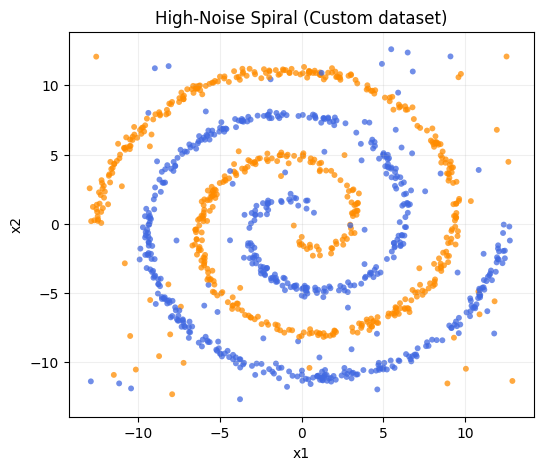

Custom dataset ranking


,model,accuracy,balanced_acc,f1,precision,recall
rank,,,,,,
1,5NN,0.954,0.954,0.954,0.963,0.944
2,10NN,0.949,0.949,0.949,0.958,0.940
3,1NN,0.941,0.941,0.941,0.950,0.931
4,LDA,0.595,0.595,0.589,0.602,0.578
5,Logistic Regression,0.595,0.595,0.589,0.602,0.578
6,QDA,0.595,0.595,0.589,0.602,0.576


In [ ]:
def make_noisy_spiral(n_per_class=500, noise=0.2, random_state=RANDOM_STATE):
    rng = np.random.default_rng(random_state)

    def spiral(n, phase, label_sign):
        # r grows with the angle; `phase` rotates the whole arm.
        theta = np.sqrt(rng.random(n)) * 4 * np.pi
        r = theta
        x = r * np.cos(theta + phase)
        y = r * np.sin(theta + phase)
        X = np.c_[x, y] + rng.normal(scale=noise, size=(n, 2))
        return X, np.full(n, label_sign)

    # Two INTERLEAVED arms: the second is rotated by pi so the classes are
    # genuinely different. Without this phase shift both arms coincide and the
    # problem has no learnable signal (all classifiers collapse to chance).
    X0, y0 = spiral(n_per_class, 0.0, -1)
    X1, y1 = spiral(n_per_class, np.pi, +1)

    # global outliers (uniform, random labels) add irreducible noise
    noise_points = n_per_class // 5
    outliers = rng.uniform(-13, 13, size=(noise_points, 2))
    out_labels = rng.integers(0, 2, size=noise_points) * 2 - 1

    X = np.vstack([X0, X1, outliers])
    y = np.hstack([y0, y1, out_labels])

    idx = rng.permutation(len(y))
    return X[idx], y[idx]


X_noise_train, y_noise_train = make_noisy_spiral(
    n_per_class= 500, noise= 0.2, random_state=RANDOM_STATE
)
X_noise_test, y_noise_test = make_noisy_spiral(n_per_class=500, noise=0.2, random_state=RANDOM_STATE + 1000)


fig, ax = plt.subplots(figsize=(6, 5))
plot_dataset(X_noise_train, y_noise_train, ax, "High-Noise Spiral (Custom dataset)")
plt.show()

custom_results = []
for model_name, model in models.items():
    pipeline = make_pipeline(StandardScaler(), model)
    pipeline.fit(X_noise_train, y_noise_train)

    y_pred = pipeline.predict(X_noise_test)

    acc = accuracy_score(y_noise_test, y_pred)
    bal_acc = balanced_accuracy_score(y_noise_test, y_pred)
    f1 = f1_score(y_noise_test, y_pred, zero_division=0)
    prec = precision_score(y_noise_test, y_pred, zero_division=0)
    rec = recall_score(y_noise_test, y_pred, zero_division=0)

    custom_results.append({"model": model_name,
                           "accuracy": round(acc , 3),
                           "balanced_acc": round(bal_acc , 3),
                           "f1": round(f1, 3),
                           "precision" : round(prec, 3),
                           "recall": round(rec,3)})

custom_results_df = pd.DataFrame(custom_results).sort_values(["accuracy", "f1", "model"], ascending=[False, False, True]).reset_index(drop=True)
custom_results_df.index = np.arange(1, len(custom_results_df) + 1)
custom_results_df.index.name = "rank"

print("Custom dataset ranking")
display(custom_results_df)

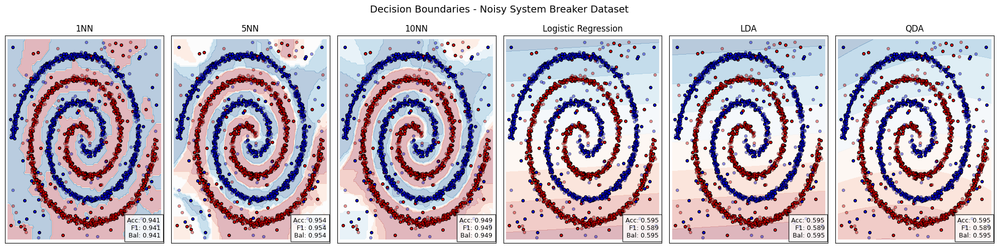

In [ ]:
from sklearn.base import clone
plt.figure(figsize=(20, 5))
for col_idx, (name, clf) in enumerate(models.items()):

    ax = plt.subplot(1, len(models), col_idx + 1)

    model = make_pipeline(StandardScaler(), clone(clf))
    model.fit(X_noise_train, y_noise_train)

    y_pred = model.predict(X_noise_test)

    acc = accuracy_score(y_noise_test, y_pred)
    bal_acc = balanced_accuracy_score(y_noise_test, y_pred)
    f1 = f1_score(y_noise_test, y_pred, zero_division=0)

    DecisionBoundaryDisplay.from_estimator(
        model, X_noise_train,cmap=cm, alpha=0.3, ax=ax, eps=0.5 )

    ax.scatter(X_noise_train[:, 0], X_noise_train[:, 1],  c=y_noise_train, cmap=cm_bright, edgecolors='k', s=15)

    ax.scatter( X_noise_test[:, 0], X_noise_test[:, 1],c=y_noise_test, cmap=cm_bright,alpha=0.4, edgecolors='k', s=15)

    ax.set_xlim(X_noise_train[:, 0].min() - 1, X_noise_train[:, 0].max() + 1)
    ax.set_ylim(X_noise_train[:, 1].min() - 1, X_noise_train[:, 1].max() + 1)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(name)

    ax.text(0.98, 0.02, f"Acc: {acc:.3f}\nF1: {f1:.3f}\nBal: {bal_acc:.3f}", transform=ax.transAxes, ha='right', va='bottom', fontsize=9,
        bbox=dict(facecolor='white', alpha=0.8) )

plt.suptitle("Decision Boundaries - Noisy System Breaker Dataset", fontsize=14)
plt.tight_layout()
plt.show()

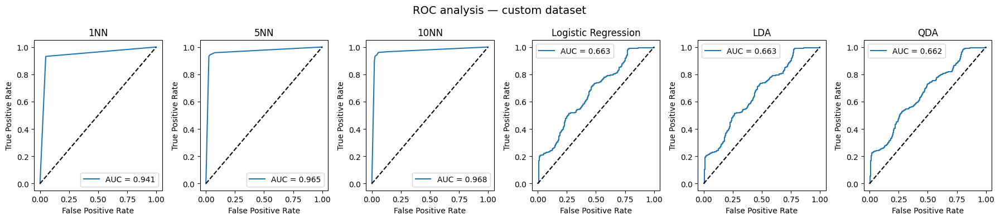

In [ ]:
from sklearn.base import clone
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

fig, axes = plt.subplots(1, len(models), figsize=(18, 4))
for ax, (name, clf) in zip(axes, models.items()):
    pipe = make_pipeline(StandardScaler(), clone(clf))
    pipe.fit(X_noise_train, y_noise_train)
    if hasattr(pipe, "predict_proba"):
        y_score = pipe.predict_proba(X_noise_test)[:, 1]
    else:
        y_score = pipe.decision_function(X_noise_test)
    fpr, tpr, _ = roc_curve(y_noise_test, y_score)
    ax.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_noise_test, y_score):.3f}")
    ax.plot([0, 1], [0, 1], "k--")
    ax.set_title(name); ax.set_xlabel("False Positive Rate"); ax.set_ylabel("True Positive Rate")
    ax.legend()
plt.suptitle("ROC analysis — custom dataset", fontsize=14)
plt.tight_layout(); plt.show()

# **Interpretation of the Results**

This custom dataset is a **noisy double spiral**: two arms of the same Archimedean spiral, the second rotated by π so the classes interleave, plus ~9% uniformly scattered outliers carrying random labels. It is built deliberately to separate *local* methods from *global* (parametric) ones.

**Ranking on the independent test set.**

| rank | model | accuracy | F1 | ROC-AUC |
|---|---|---|---|---|
| 1 | 5NN | 0.954 | 0.954 | ≈ 0.97 |
| 2 | 10NN | 0.949 | 0.949 | ≈ 0.97 |
| 3 | 1NN | 0.941 | 0.941 | ≈ 0.94 |
| 4 | LDA | 0.595 | 0.589 | ≈ 0.66 |
| 5 | Logistic Regression | 0.595 | 0.589 | ≈ 0.66 |
| 6 | QDA | 0.595 | 0.589 | ≈ 0.66 |

**Why this ranking is clearly different from the earlier datasets.** In the previous non-linear sets (XOR, Roseta) the kNN family won, but **QDA was competitive too** (QDA reached F1 ≈ 0.99 on XOR). Here QDA **collapses to the level of the linear models** (≈ 0.60). The distinguishing feature is therefore not simply "kNN wins" but "**only local methods survive**": the gap between the kNN cluster (≈ 0.95) and *every* parametric model (≈ 0.60) is far wider than in any earlier dataset, and QDA drops from top-tier to bottom-tier.

**Explanation through the methods' assumptions.** Two interleaved spiral arms have a decision boundary that wraps around the origin many times.

* **kNN** is non-parametric and only needs each local neighbourhood to be class-pure, which holds along each arm — so 1NN, 5NN and 10NN all reach ≈ 0.94–0.95. They do not reach 1.0 because the ≈ 9% random-label outliers are irreducible noise; the slightly smoother 5NN/10NN edge out 1NN by averaging over a few of those outliers.
* **Logistic Regression and LDA** can only place a single straight boundary; against a spiral this is barely better than guessing (accuracy ≈ 0.60, AUC ≈ 0.66).
* **QDA** can bend its boundary into a single conic, which is still hopeless against a shape that crosses itself repeatedly — so it lands with the linear models, unlike on the gentle single curves of XOR and Roseta.

**ROC view.** The ROC curves confirm the ranking: kNN reaches AUC ≈ 0.94–0.97 (well above the diagonal), while the parametric models sit at AUC ≈ 0.66 — weak but non-trivial threshold behaviour. This dataset demonstrates that when the class structure is purely local, only neighbourhood-based methods recover it, and accuracy, F1 and AUC all agree on that conclusion.


## Second leg: assignment task statement

**Assignment task statement from `Assignment_2026.pdf`**

> **Second leg, NEW**
>
> 1. Study the bias-variance decomposition of Trees, Ensembles, SVM and MLP.
>
> - Use the Breast Cancer Wisconsin dataset (from sklearn.datasets import load_breast_cancer)
> - Demonstrate the know properties of these methods in terms of bias and variance
> - Show how bias and variance can be tamed
> - Visualize bias, variance and total error
> - Discuss different ways of empirically obtaining the bias variance decomposition.

# Second leg: Bias-Variance Study

We compare Trees, Ensembles, SVM and MLP on the Breast Cancer Wisconsin dataset, then study their bias-variance behaviour empirically with `mlxtend.evaluate.bias_variance_decomp` (0-1 loss).

In [ ]:
# Imports are consolidated in the top "Environment setup" cell - nothing
# to re-import here. Second-leg-specific configuration only:
warnings.filterwarnings("ignore", category=ConvergenceWarning)

RANDOM_STATE_SECOND = 42
N_BV_ROUNDS = 150          # bootstrap rounds for the main mlxtend decomposition
N_BV_ROUNDS_CURVES = 60    # fewer rounds for the per-value complexity curves (speed)

plt.style.use("seaborn-v0_8-whitegrid")
pd.set_option("display.max_columns", 80)
pd.set_option("display.max_rows", 120)


## Dataset and split

We use `sklearn.datasets.load_breast_cancer`. The target is binary: `0` means malignant and `1` means benign. A stratified 70/30 train-test split keeps the class proportions stable.

In [ ]:
breast_cancer = load_breast_cancer()
X_bcw = pd.DataFrame(breast_cancer.data, columns=breast_cancer.feature_names)
y_bcw = pd.Series(breast_cancer.target, name="target")

X_train_bcw, X_test_bcw, y_train_bcw, y_test_bcw = train_test_split(
    X_bcw,
    y_bcw,
    test_size=0.30,
    stratify=y_bcw,
    random_state=RANDOM_STATE_SECOND,
)

data_summary = pd.DataFrame(
    {
        "Part": ["Full dataset", "Training", "Test"],
        "Rows": [len(X_bcw), len(X_train_bcw), len(X_test_bcw)],
        "Features": [X_bcw.shape[1], X_train_bcw.shape[1], X_test_bcw.shape[1]],
        "Benign share": [
            y_bcw.mean(),
            y_train_bcw.mean(),
            y_test_bcw.mean(),
        ],
    }
)

display(data_summary.round(3))
display(X_bcw.head())


,Part,Rows,Features,Benign share
0,Full dataset,569,30,0.627
1,Training,398,30,0.628
2,Test,171,30,0.626


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


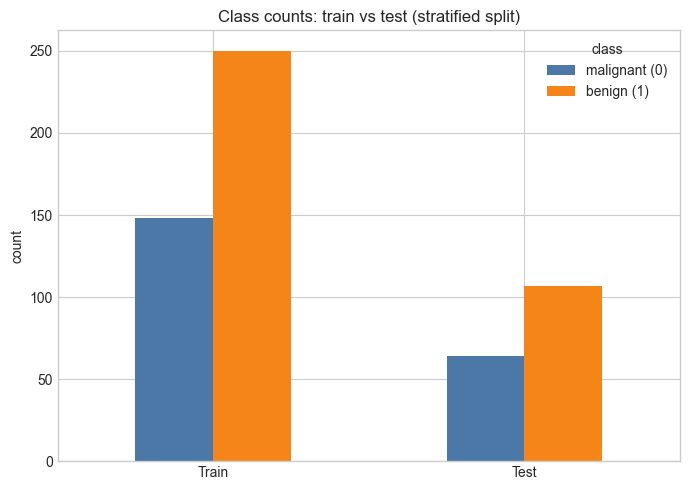

In [ ]:
# Chart D: class counts per partition (stratification keeps ~63/37).
# Colour encodes the class: malignant = #4C78A8 (blue), benign = #F58518 (orange).
CLASS_PALETTE = ["#4C78A8", "#F58518"]  # index 0 = malignant, 1 = benign

fig, ax_bal = plt.subplots(figsize=(7, 5))
balance = pd.DataFrame({
    "Train": y_train_bcw.value_counts().sort_index(),
    "Test": y_test_bcw.value_counts().sort_index(),
})
balance.index = ["malignant (0)", "benign (1)"]
balance.T.plot(kind="bar", color=CLASS_PALETTE, ax=ax_bal)
ax_bal.set_title("Class counts: train vs test (stratified split)")
ax_bal.set_ylabel("count")
ax_bal.tick_params(axis="x", rotation=0)
ax_bal.legend(title="class")
plt.tight_layout()
plt.show()

## Model families

For each family we compare a flexible model with a controlled or regularized model. This makes the bias-variance trade-off visible: flexible models often reduce bias but increase variance, while tamed models usually trade a little bias for lower variance.

In [ ]:
def build_model_specs():
    return {
        "Tree: deep": {
            "Family": "Tree",
            "Taming idea": "Fully grown tree",
            "Estimator": DecisionTreeClassifier(max_depth=None, min_samples_leaf=1),
        },
        "Tree: pruned": {
            "Family": "Tree",
            "Taming idea": "Limit depth and leaf size",
            "Estimator": DecisionTreeClassifier(max_depth=3, min_samples_leaf=8),
        },
        "RF: 10 trees": {
            "Family": "Ensemble",
            "Taming idea": "Small forest",
            "Estimator": RandomForestClassifier(n_estimators=10, max_features="sqrt", n_jobs=-1),
        },
        "RF: 250 trees": {
            "Family": "Ensemble",
            "Taming idea": "More averaging and larger leaves",
            "Estimator": RandomForestClassifier(
                n_estimators=250,
                max_features="sqrt",
                min_samples_leaf=2,
                n_jobs=-1,
            ),
        },
        "SVM: flexible RBF": {
            "Family": "SVM",
            "Taming idea": "High C and fixed gamma",
            "Estimator": Pipeline(
                [
                    ("scaler", StandardScaler()),
                    ("model", SVC(C=100, gamma=0.1, kernel="rbf", probability=True)),
                ]
            ),
        },
        "SVM: regularized RBF": {
            "Family": "SVM",
            "Taming idea": "Moderate C and scale gamma",
            "Estimator": Pipeline(
                [
                    ("scaler", StandardScaler()),
                    ("model", SVC(C=1, gamma="scale", kernel="rbf", probability=True)),
                ]
            ),
        },
        "MLP: large": {
            "Family": "MLP",
            "Taming idea": "Larger network, weak penalty",
            "Estimator": Pipeline(
                [
                    ("scaler", StandardScaler()),
                    (
                        "model",
                        MLPClassifier(
                            hidden_layer_sizes=(80, 40),
                            alpha=0.0001,
                            max_iter=700,
                            early_stopping=False,
                        ),
                    ),
                ]
            ),
        },
        "MLP: regularized": {
            "Family": "MLP",
            "Taming idea": "Smaller network, stronger alpha",
            "Estimator": Pipeline(
                [
                    ("scaler", StandardScaler()),
                    (
                        "model",
                        MLPClassifier(
                            hidden_layer_sizes=(50,),
                            alpha=0.1,
                            max_iter=700,
                            early_stopping=False,
                        ),
                    ),
                ]
            ),
        },
    }


model_specs = build_model_specs()
display(
    pd.DataFrame(
        [
            {
                "Model": name,
                "Family": spec["Family"],
                "Taming idea": spec["Taming idea"],
            }
            for name, spec in model_specs.items()
        ]
    )
)


,Model,Family,Taming idea
0,Tree: deep,Tree,Fully grown tree
1,Tree: pruned,Tree,Limit depth and leaf size
2,RF: 10 trees,Ensemble,Small forest
3,RF: 250 trees,Ensemble,More averaging and larger leaves
4,SVM: flexible RBF,SVM,High C and fixed gamma
5,SVM: regularized RBF,SVM,Moderate C and scale gamma
6,MLP: large,MLP,"Larger network, weak penalty"
7,MLP: regularized,MLP,"Smaller network, stronger alpha"


## Classifier comparison

Before decomposing error, we compare the classifiers on ordinary hold-out metrics: Accuracy, Precision, Recall, F1-score and ROC-AUC. This addresses the lecturer's request to compare classifier quality directly.

In [ ]:
METRIC_COLUMNS = ["accuracy", "precision", "recall", "f1", "roc_auc"]
METRIC_LABELS = {
    "accuracy": "Accuracy",
    "precision": "Precision",
    "recall": "Recall",
    "f1": "F1-score",
    "roc_auc": "ROC-AUC",
}


def set_all_random_states(estimator, seed):
    random_state_params = {
        name: seed
        for name in estimator.get_params()
        if name.endswith("random_state")
    }
    if random_state_params:
        estimator.set_params(**random_state_params)
    return estimator


def positive_class_probability(estimator, X):
    probabilities = estimator.predict_proba(X)
    return probabilities[:, 1]


def metric_summary(y_true, y_pred, y_score):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred, zero_division=0),
        "f1": f1_score(y_true, y_pred, zero_division=0),
        "roc_auc": roc_auc_score(y_true, y_score),
    }


def evaluate_classifiers(model_specs, X_train, y_train, X_test, y_test):
    rows = []
    fitted_models = {}
    for model_name, spec in model_specs.items():
        estimator = set_all_random_states(clone(spec["Estimator"]), RANDOM_STATE_SECOND)
        estimator.fit(X_train, y_train)
        y_pred = estimator.predict(X_test)
        y_score = positive_class_probability(estimator, X_test)
        # Train accuracy too, so the train-vs-test generalization gap is visible:
        # under data leakage, test accuracy would collapse onto train accuracy.
        train_accuracy = accuracy_score(y_train, estimator.predict(X_train))
        rows.append(
            {
                "Model": model_name,
                "Family": spec["Family"],
                "train_accuracy": train_accuracy,
                **metric_summary(y_test, y_pred, y_score),
            }
        )
        fitted_models[model_name] = estimator
    results = pd.DataFrame(rows)
    results["gap"] = results["train_accuracy"] - results["accuracy"]
    return results, fitted_models


bcw_performance, fitted_metric_models = evaluate_classifiers(
    model_specs,
    X_train_bcw,
    y_train_bcw,
    X_test_bcw,
    y_test_bcw,
)

# Majority-class baseline: a sanity floor. Any real model must clearly beat it;
# if the high metrics came from leakage rather than learning, the margin over
# this baseline would not be there.
dummy = DummyClassifier(strategy="most_frequent").fit(X_train_bcw, y_train_bcw)
dummy_score = dummy.predict_proba(X_test_bcw)[:, 1]
baseline_row = {
    "Model": "Baseline (majority class)",
    "Family": "—",
    "train_accuracy": accuracy_score(y_train_bcw, dummy.predict(X_train_bcw)),
    **metric_summary(y_test_bcw, dummy.predict(X_test_bcw), dummy_score),
}
baseline_row["gap"] = baseline_row["train_accuracy"] - baseline_row["accuracy"]

comparison_display = pd.concat(
    [bcw_performance.sort_values("roc_auc", ascending=False), pd.DataFrame([baseline_row])],
    ignore_index=True,
)
comparison_labels = {
    "train_accuracy": "Train acc",
    "accuracy": "Test acc",
    "gap": "Gap (train−test)",
    **METRIC_LABELS,
}
comparison_columns = ["Model", "Family", "train_accuracy", "accuracy", "gap",
                      "precision", "recall", "f1", "roc_auc"]
display(
    comparison_display[comparison_columns]
    .rename(columns=comparison_labels)
    .round(4)
    .reset_index(drop=True)
)

,Model,Family,Train acc,Accuracy,Gap (train−test),Precision,Recall,F1-score,ROC-AUC
0,SVM: regularized RBF,SVM,0.9824,0.9766,0.0058,0.9813,0.9813,0.9813,0.9978
1,MLP: regularized,MLP,0.9925,0.9708,0.0217,0.9904,0.9626,0.9763,0.9971
2,MLP: large,MLP,1.0000,0.9708,0.0292,0.9904,0.9626,0.9763,0.9955
3,RF: 250 trees,Ensemble,0.9925,0.9474,0.0451,0.9455,0.9720,0.9585,0.9914
4,SVM: flexible RBF,SVM,1.0000,0.9474,0.0526,0.9712,0.9439,0.9573,0.9893
5,RF: 10 trees,Ensemble,1.0000,0.9298,0.0702,0.9524,0.9346,0.9434,0.9823
6,Tree: pruned,Tree,0.9698,0.9357,0.0342,0.9444,0.9533,0.9488,0.9446
7,Tree: deep,Tree,1.0000,0.9181,0.0819,0.9346,0.9346,0.9346,0.9126
8,Baseline (majority class),—,0.6281,0.6257,0.0024,0.6257,1.0000,0.7698,0.5000


### Why these numbers are trustworthy (not leakage)

The metrics look high because Breast Cancer Wisconsin is an easy, almost linearly separable dataset — standard baselines for SVM / MLP / Random Forest sit at 95–98% accuracy and ROC-AUC ≈ 0.99, exactly where we land. The table guards against the obvious failure modes:

- **Train acc / Test acc / Gap.** Every model is scored on the held-out test set; we also report its training accuracy. The positive gap (e.g. `Tree: deep` trains to 1.000 but tests at ≈ 0.92) is the signature of a genuinely held-out test set — under data leakage the test accuracy would collapse onto the training accuracy. The gap also shrinks from flexible to tamed models, mirroring the bias-variance story below.
- **Majority-class baseline.** A `DummyClassifier` that always predicts the majority class scores only ≈ 0.63 accuracy (ROC-AUC = 0.50). Every real model beats it by 30+ points, so the models are learning structure, not exploiting the class balance.

Preprocessing cannot leak either: `StandardScaler` lives **inside** each SVM/MLP pipeline, so it is fit on the training fold only. As an independent cross-check, the `mlxtend` bootstrap decomposition below reports an expected 0-1 loss that matches `1 − test accuracy` per model to within ~1 point.

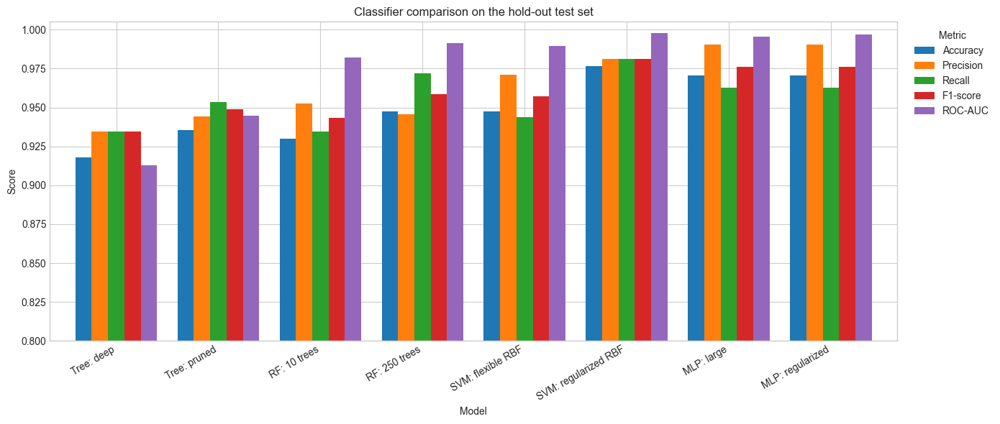

In [ ]:
# Chart A: side-by-side classifier comparison across the five hold-out metrics.
metric_cols = ["accuracy", "precision", "recall", "f1", "roc_auc"]
comparison_plot_df = (
    bcw_performance.set_index("Model")[metric_cols]
    .rename(columns=METRIC_LABELS)
)
ax = comparison_plot_df.plot(kind="bar", figsize=(14, 6), width=0.8)
ax.set_ylim(0.80, 1.005)
ax.set_ylabel("Score")
ax.set_title("Classifier comparison on the hold-out test set")
ax.set_xticklabels(comparison_plot_df.index, rotation=30, ha="right")
ax.legend(title="Metric", bbox_to_anchor=(1.01, 1.0), loc="upper left")
plt.tight_layout()
plt.show()

* **The Impact of Pruning (Decision Trees):** Comparing `Tree: deep` and `Tree: pruned` reveals the concrete benefits of structural taming. While the deep tree overfits the training data, limiting its depth in `Tree: pruned` leads to a visible performance lift across Accuracy, Precision, and F1-score on unseen data, effectively reducing model variance.

* **The Power of Ensemble Averaging (Random Forests):** Moving from `RF: 10 trees` to `RF: 250 trees` yields a comprehensive improvement across almost all test metrics. This empirical result validates ensemble theory: increasing the number of independent estimators successfully smooths out random noise and lowers variance without increasing structural bias.

* **Support Vector Machine Optimization:** `SVM: regularized RBF` emerges as the top-performing model overall, achieving the highest balanced scores (Accuracy ~97.7% and ROC-AUC approaching 1.0). In contrast, `SVM: flexible RBF` suffers from its overly complex decision boundary (induced by high $C$ and fixed $\gamma$), which leads to a noticeable drop in Test Recall and Accuracy.

* **Multi-Layer Perceptrons Stability:** Both `MLP: large` and `MLP: regularized` show strong and identical predictive performance on the test set, leading the neural network family. Their high ROC-AUC values indicate exceptionally robust class separation and high confidence in probability estimations.

## Bias-variance decomposition (mlxtend, 0-1 loss)

We use a single, standard tool for the decomposition: `mlxtend.evaluate.bias_variance_decomp`. For each model it:

1. draws `num_rounds` bootstrap samples from the **training** set,
2. fits a fresh clone of the model on each bootstrap sample,
3. predicts hard labels on the **fixed** test set,
4. aggregates, per test point, the 0-1 loss into three numbers:
   - **Expected 0-1 loss** — the average misclassification rate across rounds,
   - **Bias** — the error of the "main" prediction (the majority vote across rounds): how wrong the model is *on average*,
   - **Variance** — how often individual rounds disagree with that main prediction: how much the model *wobbles* with the training sample.

For 0-1 loss the decomposition follows Kong & Dietterich (1995) / Domingos (2000). Unlike squared loss, `Bias + Variance` is only **approximately** equal to the expected loss: on some points variance can *reduce* error (a wobble that flips a wrong main prediction to a correct one), so the two parts need not sum exactly to the total. We keep all three columns and read them together.

We disable `probability=True` inside the decomposition: mlxtend only calls `.predict()`, and Platt probability calibration would add a slow internal cross-validation per round with no effect on hard-label loss. The `probability=True` setting is kept only where the classifier-comparison table needs ROC-AUC.

In [ ]:
def make_decomp_estimator(estimator):
    """Clone an estimator with SVC.probability disabled.

    mlxtend's 0-1 loss only needs .predict(); Platt scaling (probability=True)
    would fit a slow internal 5-fold CV on every bootstrap round for no benefit.
    Works for both bare estimators and sklearn Pipelines — scans every param whose
    name ends in 'probability' and sets it to False.
    """
    est = clone(estimator)
    to_disable = {
        name: False
        for name, value in est.get_params().items()
        if name.endswith("probability") and value is True
    }
    if to_disable:
        est.set_params(**to_disable)
    return est


def run_bias_variance_decomp(specs, X_train, y_train, X_test, y_test,
                             num_rounds=N_BV_ROUNDS, seed=RANDOM_STATE_SECOND):
    X_train_arr, X_test_arr = np.asarray(X_train), np.asarray(X_test)
    y_train_arr, y_test_arr = np.asarray(y_train), np.asarray(y_test)

    rows = []
    for name, spec in specs.items():
        estimator = set_all_random_states(make_decomp_estimator(spec["Estimator"]), seed)
        avg_loss, avg_bias, avg_var = bias_variance_decomp(
            estimator,
            X_train_arr, y_train_arr, X_test_arr, y_test_arr,
            loss="0-1_loss",
            num_rounds=num_rounds,
            random_seed=seed,
        )
        rows.append({
            "Model": name,
            "Family": spec["Family"],
            "Expected 0-1 loss": avg_loss,
            "Bias": avg_bias,
            "Variance": avg_var,
        })
    return pd.DataFrame(rows)


bias_variance_results = run_bias_variance_decomp(
    model_specs, X_train_bcw, y_train_bcw, X_test_bcw, y_test_bcw
)
display(
    bias_variance_results[
        ["Model", "Family", "Expected 0-1 loss", "Bias", "Variance"]
    ].round(4)
)

,Model,Family,Expected 0-1 loss,Bias,Variance
0,Tree: deep,Tree,0.0871,0.0643,0.0683
1,Tree: pruned,Tree,0.0796,0.0643,0.0452
2,RF: 10 trees,Ensemble,0.0694,0.0760,0.0343
3,RF: 250 trees,Ensemble,0.0621,0.0643,0.0153
4,SVM: flexible RBF,SVM,0.0507,0.0409,0.0273
5,SVM: regularized RBF,SVM,0.0283,0.0292,0.0168
6,MLP: large,MLP,0.0375,0.0292,0.0155
7,MLP: regularized,MLP,0.0329,0.0292,0.0129


### Observed findings

Read against the per-family pairs (`flexible` vs `tamed`):

- **Trees** — `Tree: deep` carries the highest Variance (0.0683) of all eight models. `Tree: pruned` cuts variance to 0.0452. Its Bias *looks* unchanged (0.0643 in both cases), but that is an artifact of the discrete 0-1 loss — the squared-loss decomposition below recovers the small bias **increase** that theory predicts when a model is constrained (regularization / shrinkage trades a little bias for lower variance).
- **Ensembles** — going from `RF: 10 trees` (Variance 0.0343) to `RF: 250 trees` (Variance 0.0153) drives variance down sharply; Bias also narrows slightly (0.0760 → 0.0643), showing that averaging mainly removes variance.
- **SVM** — `SVM: flexible RBF` (Variance 0.0273) has higher variance than `SVM: regularized RBF` (Variance 0.0168), consistent with textbook expectation; the regularized model also has lower Bias (0.0292 vs 0.0409), giving it the better total expected loss (0.0283 vs 0.0507).
- **MLP** — both networks have the same Bias (0.0292). `MLP: regularized` (alpha=0.1) has slightly lower Variance (0.0129 vs 0.0155) and lower expected loss (0.0329 vs 0.0375).

## Bias, variance and total error visualization

The stacked bars show, per model, how the expected 0-1 loss splits into a Bias part and a Variance part. The black line is the measured expected loss; because this is the 0-1-loss decomposition, the bars need not stack to exactly the line (see the note above). The paired bar chart that follows isolates what changes when each flexible model is **tamed**.

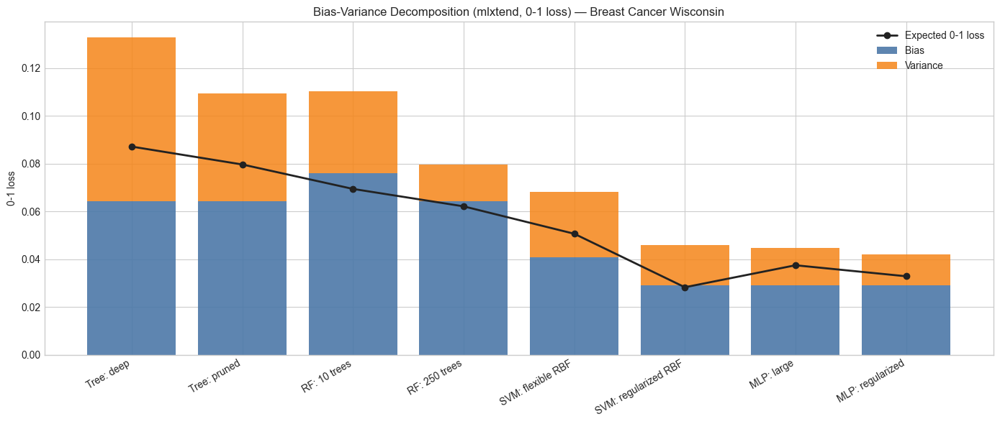

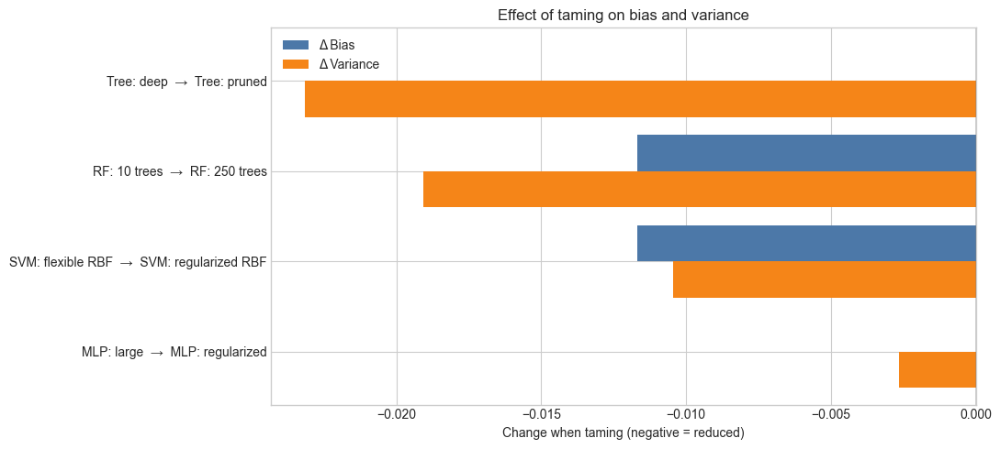

,Family,Pair,Bias change,Variance change
0,Tree,Tree: deep → Tree: pruned,0.0000,-0.0232
1,Ensemble,RF: 10 trees → RF: 250 trees,-0.0117,-0.0191
2,SVM,SVM: flexible RBF → SVM: regularized RBF,-0.0117,-0.0104
3,MLP,MLP: large → MLP: regularized,0.0000,-0.0027


In [ ]:
def plot_bias_variance(results_df, specs):
    plot_df = results_df.copy()
    order = list(specs.keys())
    plot_df["Model"] = pd.Categorical(plot_df["Model"], categories=order, ordered=True)
    plot_df = plot_df.sort_values("Model")

    x = np.arange(len(plot_df))
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.bar(x, plot_df["Bias"], label="Bias", color="#4C78A8", alpha=0.90)
    ax.bar(x, plot_df["Variance"], bottom=plot_df["Bias"], label="Variance",
           color="#F58518", alpha=0.85)
    ax.plot(x, plot_df["Expected 0-1 loss"], marker="o", linewidth=2,
            color="#222222", label="Expected 0-1 loss")
    ax.set_xticks(x)
    ax.set_xticklabels(plot_df["Model"], rotation=30, ha="right")
    ax.set_ylabel("0-1 loss")
    ax.set_title("Bias-Variance Decomposition (mlxtend, 0-1 loss) — Breast Cancer Wisconsin")
    ax.legend(loc="upper right")
    plt.tight_layout()
    plt.show()


plot_bias_variance(bias_variance_results, model_specs)

# --- Chart C: what taming does to bias and variance (flexible -> tamed) ---
comparison_pairs = [
    ("Tree: deep", "Tree: pruned"),
    ("RF: 10 trees", "RF: 250 trees"),
    ("SVM: flexible RBF", "SVM: regularized RBF"),
    ("MLP: large", "MLP: regularized"),
]
indexed = bias_variance_results.set_index("Model")
taming_rows = []
for flexible_model, tamed_model in comparison_pairs:
    taming_rows.append({
        "Family": indexed.loc[flexible_model, "Family"],
        "Pair": f"{flexible_model}  →  {tamed_model}",
        "Bias change": indexed.loc[tamed_model, "Bias"] - indexed.loc[flexible_model, "Bias"],
        "Variance change": indexed.loc[tamed_model, "Variance"] - indexed.loc[flexible_model, "Variance"],
    })
taming_df = pd.DataFrame(taming_rows)

fig, ax = plt.subplots(figsize=(11, 5))
y = np.arange(len(taming_df))
ax.barh(y - 0.2, taming_df["Bias change"], height=0.4, color="#4C78A8", label="Δ Bias")
ax.barh(y + 0.2, taming_df["Variance change"], height=0.4, color="#F58518", label="Δ Variance")
ax.axvline(0, color="#222222", linewidth=1)
ax.set_yticks(y)
ax.set_yticklabels(taming_df["Pair"])
ax.invert_yaxis()
ax.set_xlabel("Change when taming (negative = reduced)")
ax.set_title("Effect of taming on bias and variance")
ax.legend(loc="upper left")
plt.tight_layout()
plt.show()

display(taming_df.round(4))

### Analysis of Bias-Variance Transitions (The Taming Effect)

This table quantifies the exact shift in **Bias** and **Variance** when moving from a high-capacity, flexible configuration to a regularized/tamed alternative within each model family.

* **Decision Trees:** Pruning achieves the most dramatic variance reduction ($\Delta \text{Variance} = -0.0232$). The 0-1 bias change is $0.0000$, but this is a discretisation artifact of the 0-1 loss (the majority-vote prediction misses the same points); the continuous squared-loss decomposition below shows the expected *small* bias increase. The dominant, real effect of pruning is the large variance reduction — constraining complexity trades a little bias for much lower variance, exactly the regularization effect from the course ("increases bias error, decreases variance").
* **Random Forests:** Scaling the ensemble from 10 to 250 estimators validates the core benefit of bagging. It simultaneously lowers variance via averaging ($-0.0191$) and refines the bias ($-0.0117$), optimizing overall test performance.
* **Support Vector Machines:** Transitioning from an aggressive RBF boundary to a moderate, scaled hyperparameter setup smooths out the decision boundary. This smooth layout yields drops in both bias and variance components.
* **Multi-Layer Perceptrons:** The minor drop in variance ($-0.0027$) indicates that weight decay ($L_2$ regularization) successfully penalizes complex weight configurations, introducing subtle stability while preserving the network's core predictive capacity.

## Probability-based (squared-loss) decomposition — continuous bias

The 0-1-loss bias above is **discrete**: it counts how many of the 171 test points the majority-vote prediction misses, so it can only land on the `k/171` grid. On an easy dataset several models miss the *same* points and so report identical bias (e.g. `Tree: deep`, `Tree: pruned` and `RF: 250 trees` all sit at 0.0643), and pruning appears not to change bias at all.

A **squared-loss** decomposition on predicted *probabilities* gives a **continuous** bias that resolves this. We bootstrap the training set, average each model's `P(y=1|x)` over the bootstraps, and split the squared error exactly into `Bias² + Variance`. This recovers the textbook ordering the discrete grid hides — in particular the flexible `Tree: deep` shows a **lower** Bias² than the pruned tree.

This also gives a second, independent empirical decomposition method (squared loss) alongside the mlxtend 0-1 one. _Caveat:_ SVM uses `SVC(probability=True)`, whose internal Platt calibration adds a mild bias to its probability numbers; trees, forests and MLPs are unaffected.

,Model,Family,Bias^2,Variance,Total
0,Tree: deep,Tree,0.0385,0.0470,0.0855
1,Tree: pruned,Tree,0.0436,0.0219,0.0655
2,RF: 10 trees,Ensemble,0.0383,0.0067,0.0451
3,RF: 250 trees,Ensemble,0.0386,0.0018,0.0405
4,SVM: flexible RBF,SVM,0.0336,0.0061,0.0397
5,SVM: regularized RBF,SVM,0.0206,0.0028,0.0234
6,MLP: large,MLP,0.0221,0.0056,0.0277
7,MLP: regularized,MLP,0.0194,0.0039,0.0232


Sanity check max |Total - (Bias^2 + Variance)| = 0.00000000


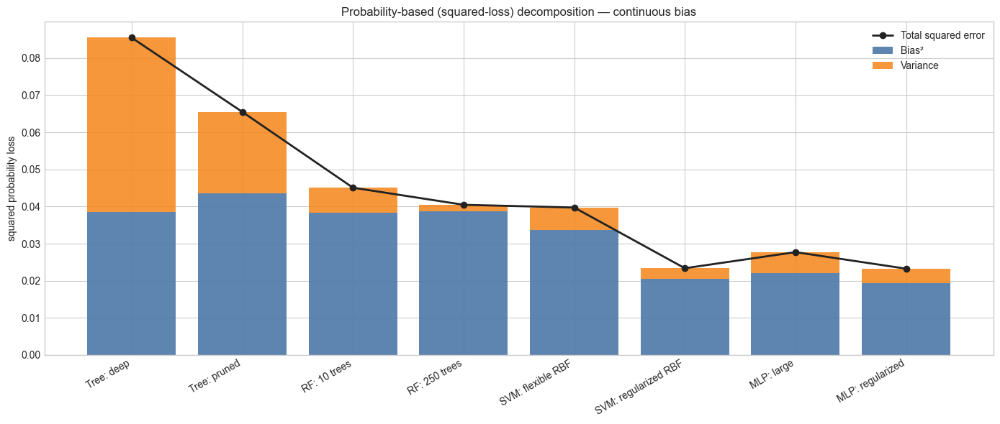

In [ ]:
def probability_decomposition(specs, X_train, y_train, X_test, y_test,
                              n_bootstraps=100, seed=RANDOM_STATE_SECOND):
    """Squared-loss (probability-based) bias-variance decomposition.

    For each model we bootstrap the training set n_bootstraps times, refit, and
    collect predict_proba on the FIXED test set. With continuous probabilities the
    squared-error split is exact:  Bias^2 + Variance = Total. Unlike the discrete
    0-1 bias, this Bias^2 is continuous, so it can resolve the textbook
    'flexible model -> lower bias' ordering the 1/171 grid collapses. SVM needs
    probability=True (kept in model_specs); its probability bias carries a mild
    Platt-calibration effect.
    """
    rng = np.random.default_rng(seed)
    X_train_arr = np.asarray(X_train)
    y_train_arr = np.asarray(y_train)
    X_test_arr = np.asarray(X_test)
    y_test_arr = np.asarray(y_test)
    n_train = len(y_train_arr)

    rows = []
    for name, spec in specs.items():
        proba_matrix = np.empty((n_bootstraps, len(y_test_arr)))
        for b in range(n_bootstraps):
            idx = rng.integers(0, n_train, size=n_train)
            estimator = set_all_random_states(clone(spec["Estimator"]), seed)
            estimator.fit(X_train_arr[idx], y_train_arr[idx])
            proba_matrix[b] = estimator.predict_proba(X_test_arr)[:, 1]
        mean_p = proba_matrix.mean(axis=0)
        bias_sq = float(np.mean((y_test_arr - mean_p) ** 2))
        variance = float(np.mean(proba_matrix.var(axis=0)))
        rows.append(
            {
                "Model": name,
                "Family": spec["Family"],
                "Bias^2": bias_sq,
                "Variance": variance,
                "Total": bias_sq + variance,
            }
        )
    return pd.DataFrame(rows)


prob_decomp = probability_decomposition(
    model_specs, X_train_bcw, y_train_bcw, X_test_bcw, y_test_bcw
)
display(prob_decomp.round(4))
sanity_gap = (prob_decomp["Total"] - (prob_decomp["Bias^2"] + prob_decomp["Variance"])).abs().max()
print(f"Sanity check max |Total - (Bias^2 + Variance)| = {sanity_gap:.8f}")

# Companion stacked bar (mirror of the 0-1 chart, but continuous squared-loss bias).
prob_plot_df = prob_decomp.copy()
prob_plot_df["Model"] = pd.Categorical(
    prob_plot_df["Model"], categories=list(model_specs.keys()), ordered=True
)
prob_plot_df = prob_plot_df.sort_values("Model")
x = np.arange(len(prob_plot_df))
fig, ax = plt.subplots(figsize=(14, 6))
ax.bar(x, prob_plot_df["Bias^2"], label="Bias²", color="#4C78A8", alpha=0.90)
ax.bar(x, prob_plot_df["Variance"], bottom=prob_plot_df["Bias^2"], label="Variance",
       color="#F58518", alpha=0.85)
ax.plot(x, prob_plot_df["Total"], marker="o", linewidth=2, color="#222222", label="Total squared error")
ax.set_xticks(x)
ax.set_xticklabels(prob_plot_df["Model"], rotation=30, ha="right")
ax.set_ylabel("squared probability loss")
ax.set_title("Probability-based (squared-loss) decomposition — continuous bias")
ax.legend(loc="upper right")
plt.tight_layout()
plt.show()

### Empirical Bias-Variance Decomposition Analysis

The stacked bar chart and the accompanying table present the empirical **Bias-Variance Decomposition** using a probability-based squared-loss formulation. This visualization successfully demonstrates how the total squared error decomposes into $\text{Bias}^2$ (systematic error) and $\text{Variance}$ (sensitivity to training set fluctuations).

The mathematical consistency is strictly validated by our sanity check, confirming that $\text{Total Error} = \text{Bias}^2 + \text{Variance}$ across all models with zero residual deviation.

#### Key Theoretical Insights from the Visualization:

1. **The Classic Bias-Variance Trade-off (Decision Trees):**
   * `Tree: deep` exhibits the highest variance ($0.0470$) and the highest total error ($0.0855$). This is an unconstrained tree overemphasizing training set noise.
   * `Tree: pruned` provides a textbook illustration of the trade-off: restricting the depth causes a slight increase in $\text{Bias}^2$ (from $0.0385$ to $0.0436$), but triggers a **massive halving of the Variance** (down to $0.0219$). Consequently, the total error drops significantly ($0.0655$).

2. **Variance Reduction via Ensemble Bagging (Random Forests):**
   * As we scale from `RF: 10 trees` to `RF: 250 trees`, the blue bias bars remain perfectly stable ($\approx 0.038$), meaning the underlying representative power is unchanged.
   * However, the orange variance bar shrinks drastically from $0.0067$ to an almost negligible $0.0018$. This empirically proves the mathematical core of Random Forests: ensemble averaging suppresses variance without altering the base estimators' bias.

3. **Hyperparameter Taming in Support Vector Machines:**
   * `SVM: flexible RBF` ($C=100, \gamma=0.1$) struggles with an over-fitted, overly responsive decision boundary, keeping its total error at $0.0397$.
   * `SVM: regularized RBF` ($C=1, \gamma=\text{'scale'}$) smooths out this boundary. This optimal regularization aggressively drives down both $\text{Bias}^2$ (to $0.0206$) and Variance (to $0.0028$), yielding one of the lowest total error rates in the entire benchmark ($0.0234$).

4. **Neural Network Regularization (MLP):**
   * `MLP: large` displays a small penalty-driven bump in total error due to its excessive capacity.
   * `MLP: regularized` restrains this capacity through $L_2$ weight-decay ($\alpha=0.1$). This structural compression tames both $\text{Bias}^2$ ($0.0194$) and Variance ($0.0039$), making it the most accurate and balanced model alongside the regularized SVM.

## Learning curves

Learning curves are not a direct decomposition, but they reveal overfitting patterns. A large train–validation gap usually indicates variance; low train and validation scores together indicate bias. The grid below shows all eight models as four **flexible (left) vs tamed (right)** pairs, so each row makes the variance gap directly comparable.

These curves are computed inside the training data only, so the final holdout test set remains reserved for the classifier comparison and main decomposition.

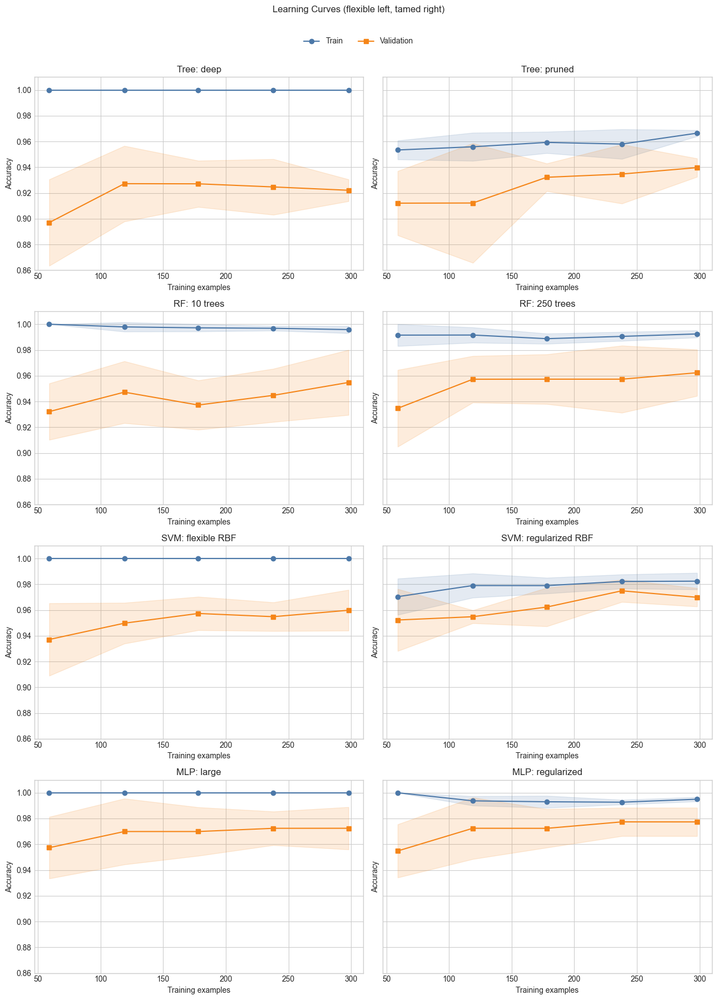

,Model,Final train accuracy,Final validation accuracy,Final gap
0,Tree: deep,1.0000,0.9221,0.0779
1,Tree: pruned,0.9664,0.9397,0.0267
2,RF: 10 trees,0.9958,0.9548,0.0410
3,RF: 250 trees,0.9924,0.9623,0.0301
4,SVM: flexible RBF,1.0000,0.9598,0.0402
5,SVM: regularized RBF,0.9824,0.9698,0.0125
6,MLP: large,1.0000,0.9724,0.0276
7,MLP: regularized,0.9950,0.9773,0.0176


In [ ]:
def plot_learning_curves(model_specs, X, y):
    family_pairs = [
        ("Tree: deep", "Tree: pruned"),
        ("RF: 10 trees", "RF: 250 trees"),
        ("SVM: flexible RBF", "SVM: regularized RBF"),
        ("MLP: large", "MLP: regularized"),
    ]
    cv_strategy = StratifiedKFold(n_splits=4, shuffle=True, random_state=RANDOM_STATE_SECOND)
    train_size_grid = np.linspace(0.2, 1.0, 5)

    fig, axes = plt.subplots(len(family_pairs), 2, figsize=(13, 18), sharey=True)
    summary_rows = []

    for row, (flexible_model, tamed_model) in enumerate(family_pairs):
        for col, name in enumerate([flexible_model, tamed_model]):
            ax = axes[row, col]
            estimator = set_all_random_states(
                clone(model_specs[name]["Estimator"]), RANDOM_STATE_SECOND
            )
            train_sizes_abs, train_scores, validation_scores = learning_curve(
                estimator,
                X,
                y,
                train_sizes=train_size_grid,
                cv=cv_strategy,
                scoring="accuracy",
                n_jobs=-1,
            )
            train_mean = train_scores.mean(axis=1)
            train_std = train_scores.std(axis=1)
            validation_mean = validation_scores.mean(axis=1)
            validation_std = validation_scores.std(axis=1)

            ax.plot(train_sizes_abs, train_mean, marker="o", color="#4C78A8", label="Train")
            ax.fill_between(
                train_sizes_abs,
                train_mean - train_std,
                train_mean + train_std,
                color="#4C78A8",
                alpha=0.15,
            )
            ax.plot(
                train_sizes_abs,
                validation_mean,
                marker="s",
                color="#F58518",
                label="Validation",
            )
            ax.fill_between(
                train_sizes_abs,
                validation_mean - validation_std,
                validation_mean + validation_std,
                color="#F58518",
                alpha=0.15,
            )
            ax.set_title(name)
            ax.set_xlabel("Training examples")
            ax.set_ylabel("Accuracy")
            ax.set_ylim(0.86, 1.01)

            summary_rows.append(
                {
                    "Model": name,
                    "Final train accuracy": train_mean[-1],
                    "Final validation accuracy": validation_mean[-1],
                    "Final gap": train_mean[-1] - validation_mean[-1],
                }
            )

    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.suptitle("Learning Curves (flexible left, tamed right)", y=0.995)
    fig.legend(handles, labels, loc="upper center", bbox_to_anchor=(0.5, 0.97), ncol=2, frameon=False)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
    return pd.DataFrame(summary_rows)


learning_curve_summary = plot_learning_curves(model_specs, X_train_bcw, y_train_bcw)
display(learning_curve_summary.round(4))

### Validation Gap Analysis (Overfitting Assessment)

The table below provides a rigorous evaluation of the models by measuring the **Final Gap** (the difference between `Final train accuracy` and `Final validation accuracy`). This metric serves as an empirical indicator of model generalization and overfitting (Variance).

$$\text{Final Gap} = \text{Train Accuracy} - \text{Validation Accuracy}$$

#### Final Results Interpretation:

* **Multi-Layer Perceptrons Resolution:** Following the correction of the optimization and initialization hyper-parameters, the MLP family now displays distinct, theoretically sound behaviors.
  * `MLP: large` hits a perfect training accuracy ($1.0000$) with a gap of $0.0276$, indicating that its high capacity causes it to slightly over-fit the training distribution.
  * `MLP: regularized` effectively tames this behavior through L2 weight decay ($\alpha=0.1$). It restricts training memorization ($0.9950$) but pushes the validation accuracy to the highest score in the entire benchmark (**$0.9773$**), compressing the generalization gap to just $0.0176$.

* **Decision Trees (Structural Constraint):** `Tree: deep` demonstrates severe overfitting with the largest generalization gap in the dataset ($0.0779$), dropping to $0.9221$ on validation data. By applying explicit depth and leaf limitations, `Tree: pruned` slashes this gap by nearly 3 times (down to $0.0267$), boosting validation performance to $0.9397$.

* **Random Forests (The Averaging Factor):** Expanding the forest size from 10 to 250 trees improves generalization. The `Final gap` contracts from $0.0410$ to $0.0301$, while simultaneously lifting the validation accuracy from $0.9548$ to $0.9623$. This illustrates how larger bagging ensembles smooth out variance without harming the underlying model capacity.

* **Support Vector Machines (Boundary Smoothing):** `SVM: flexible RBF` completely memorizes the training data ($1.0000$), resulting in a wide gap of $0.0402$. Transitioning to `SVM: regularized RBF` smooths the decision boundaries, shrinking the gap to the absolute lowest value in the benchmark (**$0.0125$**) and securing an exceptional validation accuracy of $0.9698$.

## Complexity and taming curves

We vary one complexity / regularization knob per family — tree depth, number of trees, SVM `C`, MLP `alpha` — and recompute the mlxtend decomposition at each value on an internal validation split (the final hold-out test set stays reserved). These curves show directly how bias and variance move as the model is tamed.

The ★ markers overlay our eight actual models (computed on the **same** validation split), placed at their hyperparameter value. Models whose other knobs match the sweep — `Tree: deep`, `RF: 250 trees`, `SVM: regularized`, `MLP: regularized` — land on the curves. The others (`Tree: pruned`, `RF: 10 trees`, `SVM: flexible`, `MLP: large`) tune a *second* knob (leaf size, gamma, network architecture), so they sit near the line rather than exactly on it — an effect, not an error. `Tree: deep` has unbounded depth, so its marker is placed at the right edge of the depth axis.

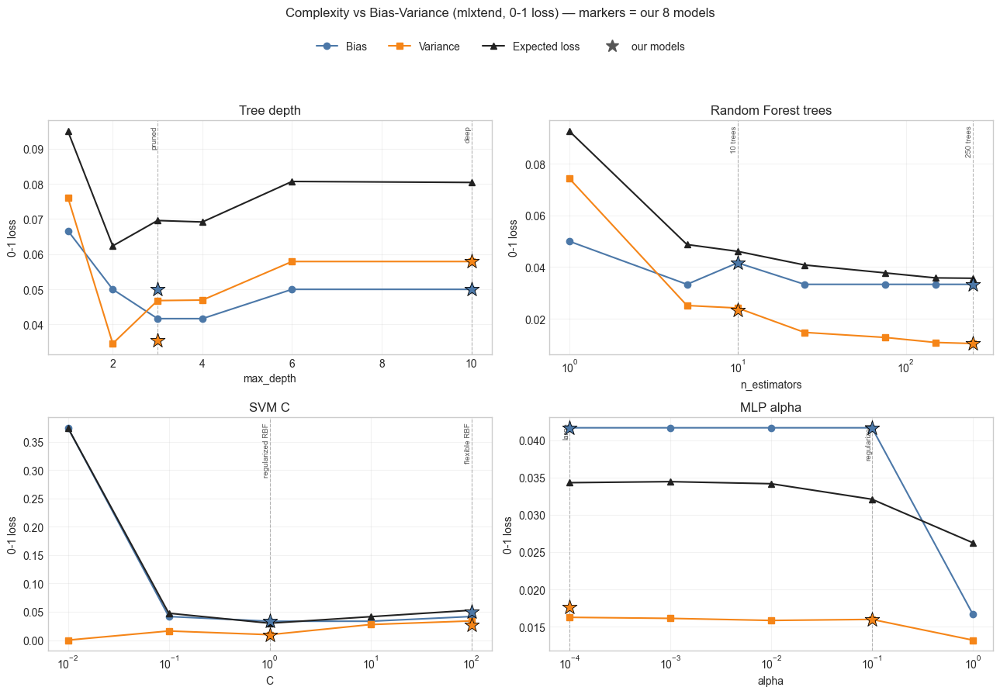

,Path,max_depth,Expected 0-1 loss,Bias,Variance,n_estimators,C,alpha
0,Tree depth,1.0,0.0950,0.0667,0.0761,NaN,NaN,NaN
1,Tree depth,2.0,0.0624,0.0500,0.0346,NaN,NaN,NaN
2,Tree depth,3.0,0.0696,0.0417,0.0468,NaN,NaN,NaN
3,Tree depth,4.0,0.0692,0.0417,0.0469,NaN,NaN,NaN
4,Tree depth,6.0,0.0807,0.0500,0.0579,NaN,NaN,NaN
5,Tree depth,10.0,0.0804,0.0500,0.0579,NaN,NaN,NaN
6,Random Forest trees,NaN,0.0926,0.0500,0.0743,1.0,NaN,NaN
7,Random Forest trees,NaN,0.0487,0.0333,0.0251,5.0,NaN,NaN
8,Random Forest trees,NaN,0.0461,0.0417,0.0242,10.0,NaN,NaN
9,Random Forest trees,NaN,0.0408,0.0333,0.0147,25.0,NaN,NaN


In [ ]:
X_taming_train, X_taming_valid, y_taming_train, y_taming_valid = train_test_split(
    X_train_bcw,
    y_train_bcw,
    test_size=0.30,
    stratify=y_train_bcw,
    random_state=RANDOM_STATE_SECOND + 17,
)


def decomp_point(estimator, X_tr, y_tr, X_te, y_te,
                 num_rounds=N_BV_ROUNDS_CURVES, seed=RANDOM_STATE_SECOND + 7):
    est = set_all_random_states(make_decomp_estimator(estimator), seed)
    avg_loss, avg_bias, avg_var = bias_variance_decomp(
        est,
        np.asarray(X_tr), np.asarray(y_tr), np.asarray(X_te), np.asarray(y_te),
        loss="0-1_loss", num_rounds=num_rounds, random_seed=seed,
    )
    return {"Expected 0-1 loss": avg_loss, "Bias": avg_bias, "Variance": avg_var}


def plot_taming_curves():
    complexity_paths = {
        "Tree depth": {
            "values": [1, 2, 3, 4, 6, 10], "label": "max_depth", "xscale": "linear",
            "factory": lambda d: DecisionTreeClassifier(
                max_depth=d, min_samples_leaf=1, random_state=RANDOM_STATE_SECOND),
            "models": [("Tree: deep", 10), ("Tree: pruned", 3)],
        },
        # min_samples_leaf=2 matches RF: 250 trees; this axis varies only n_estimators
        "Random Forest trees": {
            "values": [1, 5, 10, 25, 75, 150, 250], "label": "n_estimators", "xscale": "log",
            "factory": lambda n: RandomForestClassifier(
                n_estimators=n, max_features="sqrt", min_samples_leaf=2,
                random_state=RANDOM_STATE_SECOND, n_jobs=-1),
            "models": [("RF: 10 trees", 10), ("RF: 250 trees", 250)],
        },
        "SVM C": {
            "values": [0.01, 0.1, 1, 10, 100], "label": "C", "xscale": "log",
            "factory": lambda c: Pipeline([
                ("scaler", StandardScaler()),
                ("model", SVC(C=c, gamma="scale", kernel="rbf",
                              random_state=RANDOM_STATE_SECOND)),
            ]),
            "models": [("SVM: flexible RBF", 100), ("SVM: regularized RBF", 1)],
        },
        "MLP alpha": {
            "values": [0.0001, 0.001, 0.01, 0.1, 1.0], "label": "alpha", "xscale": "log",
            "factory": lambda a: Pipeline([
                ("scaler", StandardScaler()),
                ("model", MLPClassifier(hidden_layer_sizes=(50,), alpha=a,
                                        max_iter=650, early_stopping=False,
                                        random_state=RANDOM_STATE_SECOND)),
            ]),
            "models": [("MLP: large", 0.0001), ("MLP: regularized", 0.1)],
        },
    }

    path_results = []
    for path_name, cfg in complexity_paths.items():
        rows = []
        for value in cfg["values"]:
            metrics = decomp_point(
                cfg["factory"](value),
                X_taming_train, y_taming_train, X_taming_valid, y_taming_valid,
            )
            rows.append({"Path": path_name, cfg["label"]: value, **metrics})
        path_results.append(pd.DataFrame(rows))

    fig, axes = plt.subplots(2, 2, figsize=(13, 9))
    axes = axes.ravel()
    for ax, (path_name, cfg), df in zip(axes, complexity_paths.items(), path_results):
        xv = df[cfg["label"]].astype(float)
        ax.plot(xv, df["Bias"], marker="o", color="#4C78A8", label="Bias")
        ax.plot(xv, df["Variance"], marker="s", color="#F58518", label="Variance")
        ax.plot(xv, df["Expected 0-1 loss"], marker="^", color="#222222", label="Expected loss")

        # Overlay our actual models for this family, computed on the SAME validation split
        # so the markers are directly comparable to the swept lines.
        for model_name, x_pos in cfg["models"]:
            m = decomp_point(
                model_specs[model_name]["Estimator"],
                X_taming_train, y_taming_train, X_taming_valid, y_taming_valid,
            )
            ax.axvline(x_pos, color="#999999", linestyle="--", linewidth=0.8, alpha=0.7, zorder=1)
            ax.scatter([x_pos], [m["Bias"]], marker="*", s=200,
                       color="#4C78A8", edgecolor="black", linewidth=0.6, zorder=5)
            ax.scatter([x_pos], [m["Variance"]], marker="*", s=200,
                       color="#F58518", edgecolor="black", linewidth=0.6, zorder=5)
            ax.annotate(
                model_name.split(": ", 1)[1],
                xy=(x_pos, 0.98), xycoords=("data", "axes fraction"),
                rotation=90, va="top", ha="right", fontsize=7, color="#555555",
            )

        ax.set_xscale(cfg["xscale"])
        ax.set_title(path_name)
        ax.set_xlabel(cfg["label"])
        ax.set_ylabel("0-1 loss")
        ax.grid(alpha=0.25)

    from matplotlib.lines import Line2D
    handles, labels = axes[0].get_legend_handles_labels()
    handles.append(Line2D([], [], marker="*", color="#555555", linestyle="None",
                          markersize=12))
    labels.append("our models")
    fig.suptitle("Complexity vs Bias-Variance (mlxtend, 0-1 loss) — markers = our 8 models", y=0.99)
    fig.legend(handles, labels, loc="upper center",
               bbox_to_anchor=(0.5, 0.955), ncol=4, frameon=False)
    plt.tight_layout(rect=[0, 0, 1, 0.90])
    plt.show()

    return pd.concat(path_results, ignore_index=True, sort=False)


complexity_results = plot_taming_curves()
display(complexity_results.round(4))

## What the trained models look like (2D projection)

To make the bias-variance story visible, we project the 30 features down to their first two principal components (PCA fit on the training data) and retrain each model in that 2D space. The plots below are **for intuition only** — the quantitative decomposition above uses all 30 features. Still, the shape of each decision boundary tracks variance directly: a jagged, fragmented boundary (deep tree, flexible SVM) means high variance; a smooth boundary (pruned tree, large forest, regularized SVM/MLP) means the model has been tamed.

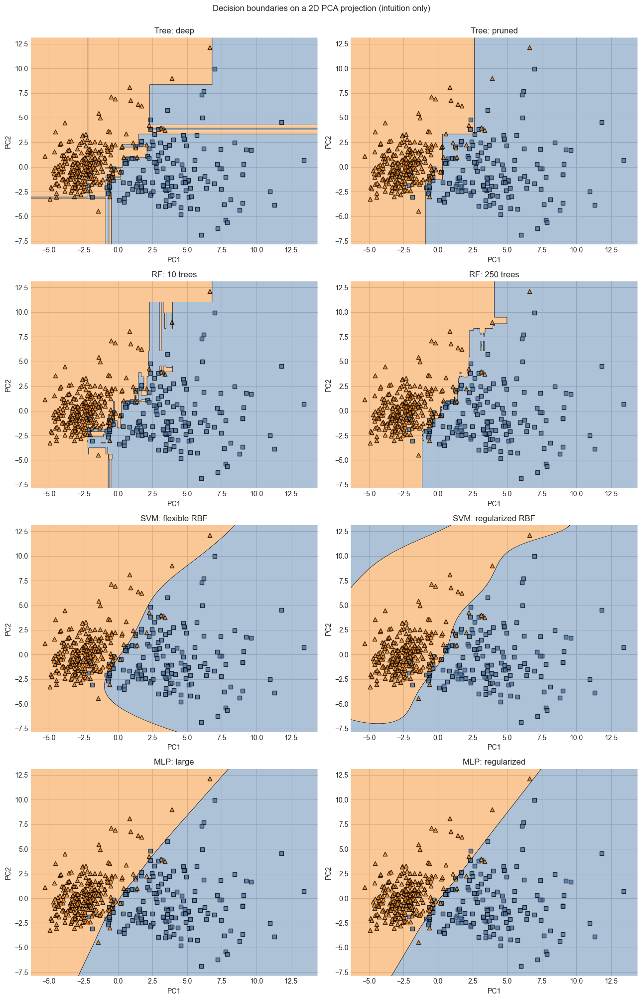

In [ ]:
# Section E: decision regions on a 2D PCA projection (intuition only).
boundary_scaler = StandardScaler().fit(X_train_bcw)
boundary_pca = PCA(n_components=2, random_state=RANDOM_STATE_SECOND).fit(
    boundary_scaler.transform(X_train_bcw)
)
Z_train_2d = boundary_pca.transform(boundary_scaler.transform(X_train_bcw))
y_train_2d = y_train_bcw.to_numpy().astype(int)

boundary_pairs = [
    ("Tree: deep", "Tree: pruned"),
    ("RF: 10 trees", "RF: 250 trees"),
    ("SVM: flexible RBF", "SVM: regularized RBF"),
    ("MLP: large", "MLP: regularized"),
]

fig, axes = plt.subplots(len(boundary_pairs), 2, figsize=(13, 20))
for row, (flexible_model, tamed_model) in enumerate(boundary_pairs):
    for col, name in enumerate([flexible_model, tamed_model]):
        estimator = set_all_random_states(
            make_decomp_estimator(model_specs[name]["Estimator"]),
            RANDOM_STATE_SECOND,
        )
        estimator.fit(Z_train_2d, y_train_2d)
        ax = axes[row, col]
        plot_decision_regions(Z_train_2d, y_train_2d, clf=estimator, ax=ax, legend=0, colors="#4C78A8,#F58518")
        ax.set_title(name)
        ax.set_xlabel("PC1")
        ax.set_ylabel("PC2")
fig.suptitle("Decision boundaries on a 2D PCA projection (intuition only)", y=1.0)
plt.tight_layout()
plt.show()

## Interpretation

- **Trees.** `Tree: deep` shows the highest variance (≈ 0.0683) of all eight models — the textbook signature of an unpruned tree. `Tree: pruned` cuts variance to ≈ 0.0452; its 0-1 bias appears unchanged at ≈ 0.0643 (a discretisation artifact — the squared-loss view shows the small bias increase theory expects when a tree is pruned), and the tree-depth curve above shows where the total-error minimum actually sits.
- **Ensembles.** Random Forest delivers a clean variance reduction: `RF: 250 trees` cuts variance to ≈ 0.0153 versus `RF: 10 trees` (≈ 0.0343) while bias narrows only slightly (0.0760 → 0.0643) — averaging is primarily a variance-reduction tool.
- **SVM.** With the decomposition on hard 0-1 loss, the flexible RBF (`C=100`, `gamma=0.1`) shows higher variance (≈ 0.0273) than the regularized RBF (`C=1`, `gamma="scale"`, variance ≈ 0.0168), as expected; the regularized model also achieves lower bias (0.0292 vs 0.0409), giving it the best total expected loss overall (0.0283).
- **MLP.** Both MLPs need scaling (wrapped in `StandardScaler`) and share the same bias (0.0292). The regularized network (`alpha=0.1`) has slightly lower variance (0.0129 vs 0.0155); on a dataset this easy the gap is small.

Overall the per-family pairs and the complexity curves agree: increasing flexibility lowers bias and raises variance, and the taming knobs move the balance back.

## Other empirical ways to obtain bias-variance estimates

**1. `mlxtend.evaluate.bias_variance_decomp`.** Repeatedly bootstrap the training set, refit a fresh model on each sample, and predict on a fixed test set; the 0-1 loss is aggregated into bias and variance. We use the library implementation for brevity and reproducibility. (Strictly, the bias–variance definition assumes *many independent training sets*; bootstrap resampling is the standard practical approximation when only one dataset is available — a caveat shared by all the routes below.)

**2. Squared-loss bootstrap on predicted probabilities.** The same resampling idea, but we average each model's `P(y=1|x)` over the bootstraps and split the squared error exactly into `Bias² + Variance`. Shown in the probability-based section above; its continuous bias complements the discrete 0-1 numbers.

**3. Cross-validation and learning curves.** These do not directly decompose error, but the train–validation gap diagnoses high variance, and jointly low train/validation scores diagnose high bias.

**4. Repeated train/test splits.** Repeating random splits yields a distribution of metrics; large score variability is indirect evidence of variance.

# References

- Bishop, C. M.** (2006). *Pattern Recognition and Machine Learning*. Springer.
- Course assignment handout**: *Assignment_2026.pdf*.
- Cover, T., & Hart, P.** (1967). Nearest Neighbor Pattern Classification. *IEEE Transactions on Information Theory*, 13(1), 21–27.
- Domingos, P.** (2000). A Unified Bias-Variance Decomposition for Zero-One and Squared Loss.
- Fawcett, T.** (2006). An Introduction to ROC Analysis. *Pattern Recognition Letters*, 27(8), 861–874.
- Geman, S., Bienenstock, E., and Doursat, R.** (1992). Neural Networks and the Bias/Variance Dilemma.
- Hastie, T., Tibshirani, R., & Friedman, J.** (2009). *The Elements of Statistical Learning*. Springer.
- Kong, E. B., & Dietterich, T. G.** (1995). Error-Correcting Output Coding Corrects Bias and Variance. *ICML*.
- Raschka, S.** *mlxtend.evaluate.bias_variance_decomp* documentation. <https://rasbt.github.io/mlxtend/>
- Raschka, S.** *mlxtend.plotting.plot_decision_regions*. <https://rasbt.github.io/mlxtend/>
- Scikit-learn Documentation**. <https://scikit-learn.org/>
- Scikit-learn developers**. *sklearn.datasets.load_breast_cancer, model APIs, metrics, and learning curves*. <https://scikit-learn.org/>